# Libraries

In [1]:
# Load libraries
# Performance tracking
import time
from datetime import timedelta
import datetime
import psutil # for memory checks
import winsound # for sound notification when script over
from contextlib import redirect_stdout # to export console output (summaries) # code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras

#Data Handling
import pandas as pd
import geopandas as gpd
import shapely                 #needed to set geopandas geometry 
from shapely.wkt import loads  #needed to set geopandas geometry
import math

#Analysis
import numpy as np
import statsmodels.formula.api as smf
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")
# for GWR and MGWR
import pysal
import libpysal
from pysal.model import mgwr
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap
from descartes import PolygonPatch
from libpysal.weights.contiguity import Queen
from pysal.model import spreg
from libpysal import weights
from pysal.explore import esda
from statsmodels.stats.outliers_influence import variance_inflation_factor
# for RF
import scipy
from sklearn import datasets
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance # different way to check for feature importance, also helps check for overfitting
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sprf.spatial_random_forest import SpatialRandomForest
from sprf.geographical_random_forest import GeographicalRandomForest


# Graphics
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import colors


#from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
#import warnings
#warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
#warnings.simplefilter('ignore', category=NumbaPendingDeprecationWarning)
#warnings.filterwarnings("ignore")
# If you still see warnings, don't worry because we're using newer version of numba but older version of libpysal - just rerun and ignore for now

# Data preparation  
Uses data from the class practicals, edited by Nazifa to add house age and energy consumption. In the steps below I am adding energy efficiency rating.

In [2]:
# Read data
df = pd.read_csv('data/ec_multiple_variables.csv')
df2 = pd.read_csv('data/387585230023928.csv') #energy rating data
# df3 = pd.read_csv('data/HPSSA Dataset 46 - Median price paid for residential properties by LSOA - abridged.csv') # House price data - dropped, too many NaN to correct
df4 = pd.read_csv('data/census2021-ts017-lsoa-abridged.csv') # Household size
df5 = pd.read_csv('data/census2021-ts011-lsoa-abridged.csv') # Household deprivation
df6 = pd.read_csv('data/census2021-ts053-lsoa-abridged.csv') # Household occupancy

In [3]:
#Merge energy efficiency rating data
# 1. Create new LSOA21CD column in df2 with LSOA code only, to use for merge
df2['LSOA21CD']=df2['2021 super output area - lower layer'].str.slice(0,9) #keep only first 9 characters
to_move = df2.pop('LSOA21CD')
df2.insert(0,'LSOA21CD',to_move) #insert column in first place
# 2. Merge
df = df.merge(df2, on='LSOA21CD')

In [4]:
# Merge median house price data
# df = df.merge(df3, on='LSOA21CD')
# Merge household size
df = df.merge(df4, on='LSOA21CD')
# Merge household deprivation
df = df.merge(df5, on='LSOA21CD')
# Merge household occupancy
df = df.merge(df6, on='LSOA21CD')

In [5]:
df.columns

Index(['Unnamed: 0', 'LSOA21CD', 'AREA_NAME', 'BP_PRE_1900', 'BP_1900_1918',
       'BP_1919_1929', 'BP_1930_1939', 'BP_1945_1954', 'BP_1955_1964',
       'BP_1965_1972',
       ...
       'EE_D%', 'EE_E%', 'EE_F%', 'EE_G%', 'prop_HHSize3OrLess',
       'prop_HHSize4OrMore', 'prop_HHDepriv1OrLess', 'prop_HHDepriv2OrMore',
       'HHOccupancyPropOvercrowded', 'HHOccupancyPropNeutralOrUnderoccupied'],
      dtype='object', length=133)

In [6]:
# Selecting only interesting variables
colnames = list(df.loc[:,'LSOA21CD':'AREA_NAME'].columns
     .append(df[['MSOA21NM', 'LAD22NM', 'LSOA21KM2', 'geometry', 'TotRes21']].columns)
     .append(df[['TotHHolds21']].columns)
     .append(df[['QualNone21','QualSch21','QualUni21','QualOt21']].columns)
     .append(df.loc[:,'All usual residents aged 16+':'Full time students'].columns)
     .append(df.loc[:,'Estimated Population':'prop_BP_UNKNOWN'].columns)
     .append(df.loc[:,'EE_Total':'HHOccupancyPropNeutralOrUnderoccupied'].columns)
               )
colnames

['LSOA21CD',
 'AREA_NAME',
 'MSOA21NM',
 'LAD22NM',
 'LSOA21KM2',
 'geometry',
 'TotRes21',
 'TotHHolds21',
 'QualNone21',
 'QualSch21',
 'QualUni21',
 'QualOt21',
 'All usual residents aged 16+',
 'Higher managerial admin and professional ',
 'Lower managerial admin and professional ',
 'Intermediate ',
 'Small employers, own account workers',
 'Lower supervisory and technical ',
 'Semi routine',
 'Routine ',
 'Never worked and long term unemployed',
 'Full time students',
 'Estimated Population',
 'Latitude',
 'Longitude',
 'Shape_Area',
 'Number of Connected Electricity Meters',
 'Electricity Consumption (kWh)',
 'Mean Electricity Consumption (kWh) per meter',
 'Median Electricity Consumption (kWh) per meter',
 'Number of Consuming Gas Meters',
 'Gas Consumption (kWh)',
 'Mean Gas Consumption (kWh per meter)',
 'Median Gas Consumption (kWh per meter)',
 'Numer of non-consuming Gas meters',
 'Total Energy Consumption (kWh)',
 'Average Energy Consumption per Person (kWh)',
 'prop_BP_P

In [7]:
#Making shorter df with only selected variables
short_df=df[colnames]
short_df

,LSOA21CD,AREA_NAME,MSOA21NM,LAD22NM,LSOA21KM2,geometry,TotRes21,TotHHolds21,QualNone21,QualSch21,...,EE_D%,EE_E%,EE_F%,EE_G%,prop_HHSize3OrLess,prop_HHSize4OrMore,prop_HHDepriv1OrLess,prop_HHDepriv2OrMore,HHOccupancyPropOvercrowded,HHOccupancyPropNeutralOrUnderoccupied
0,E01000027,Barking and Dagenham 001A,Barking and Dagenham 001,Barking and Dagenham,1.47453,"POLYGON ((548881.5630000001 190845.2650000006,...",2082,662,380,664,...,33.3,9.0,1.3,0.3,0.593373,0.406627,0.655589,0.344411,0.447130,0.552870
1,E01000028,Barking and Dagenham 001B,Barking and Dagenham 001,Barking and Dagenham,0.14389,"POLYGON ((547781 189652, 547817.3190000001 189...",1817,621,329,542,...,38.3,9.2,0.3,0.0,0.646302,0.353698,0.687601,0.312399,0.319936,0.680064
2,E01000029,Barking and Dagenham 001C,Barking and Dagenham 001,Barking and Dagenham,0.25688,POLYGON ((547758.7359999996 189426.73699999973...,1819,681,340,584,...,51.5,19.3,1.7,0.3,0.708029,0.291971,0.794420,0.205580,0.632353,0.367647
3,E01000030,Barking and Dagenham 001D,Barking and Dagenham 001,Barking and Dagenham,0.28627,"POLYGON ((547947.7350000003 189671.9450000003,...",2563,906,384,708,...,40.4,5.4,1.3,0.2,0.663366,0.336634,0.703091,0.296909,0.351052,0.648948
4,E01000031,Barking and Dagenham 002A,Barking and Dagenham 002,Barking and Dagenham,0.84342,"POLYGON ((549102.4380000001 189324.625, 548954...",1770,595,284,563,...,55.9,20.9,0.9,0.3,0.633613,0.366387,0.799325,0.200675,0.678992,0.321008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4649,E01033599,Westminster 023G,Westminster 023,Westminster,0.06582,POLYGON ((528789.1424000002 178213.24840000086...,1301,525,181,391,...,9.5,2.9,0.3,0.0,0.771429,0.228571,0.735238,0.264762,0.275335,0.724665
4650,E01004665,Westminster 024A,Westminster 024,Westminster,0.04783,POLYGON ((529224.0549999997 177918.32599999942...,1453,579,276,443,...,31.8,6.2,0.0,0.0,0.742215,0.257785,0.590674,0.409326,0.291883,0.708117
4651,E01004669,Westminster 024B,Westminster 024,Westminster,0.07198,"MULTIPOLYGON (((528583.1179 177944.6372999996,...",1721,729,246,463,...,41.4,5.9,0.0,0.0,0.782192,0.217808,0.656593,0.343407,0.267857,0.732143
4652,E01004737,Westminster 024C,Westminster 024,Westminster,0.08100,"POLYGON ((530039.5380999995 178242.6060000006,...",1218,601,177,288,...,21.3,3.1,0.3,0.0,0.866667,0.133333,0.800333,0.199667,0.440735,0.559265


## Normalisation of extensive data

In [8]:
# Normalising extensive data
# Occupational
# columns to divide (list of names)
divided = list(short_df.loc[:,'Higher managerial admin and professional ':'Full time students'].columns)
# divisor color name
divisor = 'All usual residents aged 16+'
# Loop to apply division and add prefix to all columns in the list
for col in divided:
    short_df[f'prop_{col}'] = short_df[col]/short_df[divisor]

# Qualification
# columns to divide (list of names)
divided = list(short_df.loc[:,'QualNone21':'QualOt21'].columns)
# divisor column name
divisor = 'TotRes21'
# Loop to apply division and add prefix to all columns in the list
for col in divided:
    short_df[f'prop_{col}'] = short_df[col]/short_df[divisor]

# Population density and household density
short_df['PopDensKm2']= short_df['TotRes21']/short_df['LSOA21KM2']
short_df['HholdDensKm2']= short_df['TotHHolds21']/short_df['LSOA21KM2']

#Power per household
short_df['Energy Consumption Per Household (kWh)']= short_df['Total Energy Consumption (kWh)']/short_df['TotHHolds21']

#Energy rating
#converting percents to proportion, for consistency with other indices
# columns to divide (list of names)
divided = list(short_df.loc[:,'EE_A%':'EE_G%'].columns)
# Loop to apply division and add prefix to all columns in the list
for col in divided:
    short_df[f'prop_{col[:-1]}'] = short_df[col]/100
# remove % columns
short_df = short_df.drop(columns = divided)

#Print result
short_df

,LSOA21CD,AREA_NAME,MSOA21NM,LAD22NM,LSOA21KM2,geometry,TotRes21,TotHHolds21,QualNone21,QualSch21,...,PopDensKm2,HholdDensKm2,Energy Consumption Per Household (kWh),prop_EE_A,prop_EE_B,prop_EE_C,prop_EE_D,prop_EE_E,prop_EE_F,prop_EE_G
0,E01000027,Barking and Dagenham 001A,Barking and Dagenham 001,Barking and Dagenham,1.47453,"POLYGON ((548881.5630000001 190845.2650000006,...",2082,662,380,664,...,1411.975341,448.956617,15118.823792,0.034,0.023,0.504,0.333,0.090,0.013,0.003
1,E01000028,Barking and Dagenham 001B,Barking and Dagenham 001,Barking and Dagenham,0.14389,"POLYGON ((547781 189652, 547817.3190000001 189...",1817,621,329,542,...,12627.701717,4315.796789,12838.786072,0.000,0.029,0.493,0.383,0.092,0.003,0.000
2,E01000029,Barking and Dagenham 001C,Barking and Dagenham 001,Barking and Dagenham,0.25688,POLYGON ((547758.7359999996 189426.73699999973...,1819,681,340,584,...,7081.127375,2651.043289,16098.101924,0.000,0.017,0.256,0.515,0.193,0.017,0.003
3,E01000030,Barking and Dagenham 001D,Barking and Dagenham 001,Barking and Dagenham,0.28627,"POLYGON ((547947.7350000003 189671.9450000003,...",2563,906,384,708,...,8953.086247,3164.844378,11295.790839,0.000,0.189,0.339,0.404,0.054,0.013,0.002
4,E01000031,Barking and Dagenham 002A,Barking and Dagenham 002,Barking and Dagenham,0.84342,"POLYGON ((549102.4380000001 189324.625, 548954...",1770,595,284,563,...,2098.598563,705.461099,19117.140706,0.003,0.025,0.191,0.559,0.209,0.009,0.003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4649,E01033599,Westminster 023G,Westminster 023,Westminster,0.06582,POLYGON ((528789.1424000002 178213.24840000086...,1301,525,181,391,...,19766.028563,7976.298997,8201.719090,0.000,0.433,0.441,0.095,0.029,0.003,0.000
4650,E01004665,Westminster 024A,Westminster 024,Westminster,0.04783,POLYGON ((529224.0549999997 177918.32599999942...,1453,579,276,443,...,30378.423584,12105.373197,2614.214528,0.000,0.000,0.620,0.318,0.062,0.000,0.000
4651,E01004669,Westminster 024B,Westminster 024,Westminster,0.07198,"MULTIPOLYGON (((528583.1179 177944.6372999996,...",1721,729,246,463,...,23909.419283,10127.813281,3531.207660,0.000,0.003,0.523,0.414,0.059,0.000,0.000
4652,E01004737,Westminster 024C,Westminster 024,Westminster,0.08100,"POLYGON ((530039.5380999995 178242.6060000006,...",1218,601,177,288,...,15037.037037,7419.753086,16356.907835,0.000,0.141,0.611,0.213,0.031,0.003,0.000


In [9]:
#set the geometry column
short_df = gpd.GeoDataFrame(short_df)  #geopandas
short_df['geometry'] = short_df['geometry'].apply(lambda x: loads(x))  #from shapely
short_df = short_df.set_geometry('geometry',crs='epsg:27700')  #supply crs to ensure appropriate display

## Aggregation & renaming

In [10]:
#Aggregating categories to reduce number of variables
short_df['prop_EE_ABC'] = short_df['prop_EE_A']+short_df['prop_EE_B']+short_df['prop_EE_C']
# short_df['prop_EE_DEFG'] = short_df['prop_EE_D']+short_df['prop_EE_E']+short_df['prop_EE_F']+short_df['prop_EE_G'] #Irrelevant, exact opposite of ABC
short_df['prop_BP_1900_1939'] = short_df['prop_BP_1900_1918'] + short_df['prop_BP_1919_1929'] + short_df['prop_BP_1930_1939'] #Open-Air (larger age categories after Shuo Chen 2021)
short_df['prop_BP_1945_1972']= short_df['prop_BP_1945_1954'] + short_df['prop_BP_1955_1964'] + short_df['prop_BP_1965_1972'] #Post War
short_df['prop_BP_1973_1999'] = short_df['prop_BP_1973_1982'] + short_df['prop_BP_1983_1992'] + short_df['prop_BP_1993_1999'] #Post Oil Crisis

#Other variables used:
# House age:
#prop_BP_PRE_1900 would be considered Victorian in Shuo Chen 2021
#prop_BP_2000_2009
#prop_BP_2010_2015

# Socio-economic:
# Profession:
short_df['prop_HiLvlJobs']= short_df['prop_Higher managerial admin and professional ']+short_df['prop_Lower managerial admin and professional ']+short_df['prop_Intermediate ']+short_df['prop_Small employers, own account workers']
# Qualification
# try prop_QualUni21 or prop_QualNone21 as both have fairly decent correlation with ECPH

#Naming issues with ols
short_df['ECPH'] = short_df['Energy Consumption Per Household (kWh)']

## Dropping extensive values & unused columns

In [11]:
short_df = short_df.drop(columns= ['TotRes21', 'TotHHolds21', 'QualNone21', 'QualSch21', 'QualUni21',
       'QualOt21', 'All usual residents aged 16+',
       'Higher managerial admin and professional ',
       'Lower managerial admin and professional ', 'Intermediate ',
       'Small employers, own account workers',
       'Lower supervisory and technical ', 'Semi routine', 'Routine ',
       'Never worked and long term unemployed', 'Full time students',
       'Estimated Population', 'Shape_Area',
       'Number of Connected Electricity Meters',
       'Electricity Consumption (kWh)',
       'Mean Electricity Consumption (kWh) per meter',
       'Median Electricity Consumption (kWh) per meter',
       'Number of Consuming Gas Meters', 'Gas Consumption (kWh)',
       'Mean Gas Consumption (kWh per meter)',
       'Median Gas Consumption (kWh per meter)',
       'Numer of non-consuming Gas meters', 'Total Energy Consumption (kWh)'])
short_df.columns

Index(['LSOA21CD', 'AREA_NAME', 'MSOA21NM', 'LAD22NM', 'LSOA21KM2', 'geometry',
       'Latitude', 'Longitude', 'Average Energy Consumption per Person (kWh)',
       'prop_BP_PRE_1900', 'prop_BP_1900_1918', 'prop_BP_1919_1929',
       'prop_BP_1930_1939', 'prop_BP_1945_1954', 'prop_BP_1955_1964',
       'prop_BP_1965_1972', 'prop_BP_1973_1982', 'prop_BP_1983_1992',
       'prop_BP_1993_1999', 'prop_BP_2000_2009', 'prop_BP_2010_2015',
       'prop_BP_UNKNOWN', 'EE_Total', 'prop_HHSize3OrLess',
       'prop_HHSize4OrMore', 'prop_HHDepriv1OrLess', 'prop_HHDepriv2OrMore',
       'HHOccupancyPropOvercrowded', 'HHOccupancyPropNeutralOrUnderoccupied',
       'prop_Higher managerial admin and professional ',
       'prop_Lower managerial admin and professional ', 'prop_Intermediate ',
       'prop_Small employers, own account workers',
       'prop_Lower supervisory and technical ', 'prop_Semi routine',
       'prop_Routine ', 'prop_Never worked and long term unemployed',
       'prop_Full tim

# VIF, spatial lag & spatial error models, GWR & MGWR  
Initial tests carried by Kai during CW1 (while I was doing EDA and correlation checks).

Selected the variables ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2010_2015', 'prop_HiLvlJobs'] after VIF

Discarded Spatial lag & spatial error models as less good than GWR & MGWR. Found spatial patterns in residuals --> spatial models preferred

# **SECTION 1**: models selection & initial tuning of model settings

# Modelling 1 - testing best fit with variables selected in CW1

## Variables for all models - modify here for comparison runs

In [16]:
# Parameters selected
# this was used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters
covar = ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2010_2015', 'prop_HiLvlJobs'] # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

## Machine Learning

In [258]:
# Split data into training & testing sets
df_train, df_test = train_test_split(short_df, test_size = test_prop, random_state = seed)

X = short_df[covar]
y = short_df[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [259]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train) # setting min leaf to counteract overfitting
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.61999
RF test R2: 0.50988
RF Model - R²: 0.5098841512095077, MAE: 2606.045741846242, RMSE: 3742.2693615901053


In [260]:
# Residuals
res_rf = y_test-y_pred

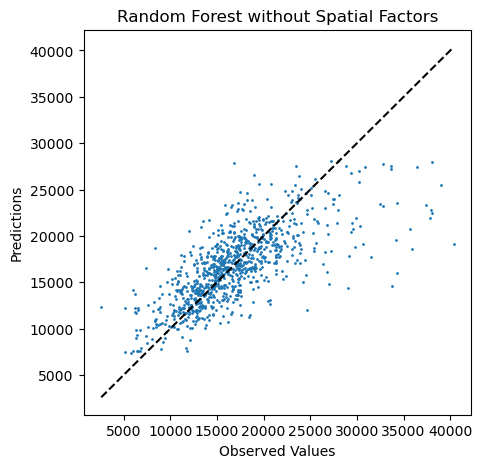

In [261]:
# Check predictions against test set
plt.figure(figsize=(5, 5))
plt.scatter(y_test, y_pred, s=1)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.title('Random Forest without Spatial Factors')
plt.show()

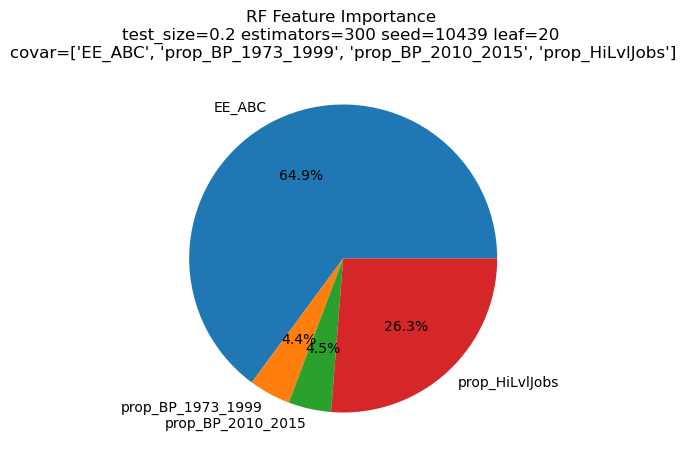

In [262]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/RF_FeatImport_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar}.png', dpi=300, bbox_inches='tight')
plt.show()

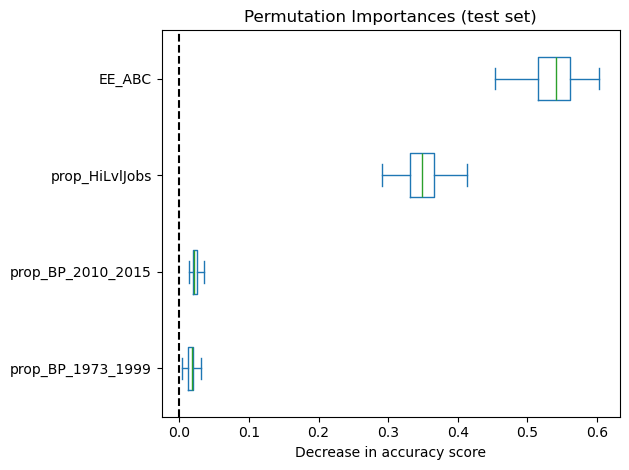

In [263]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

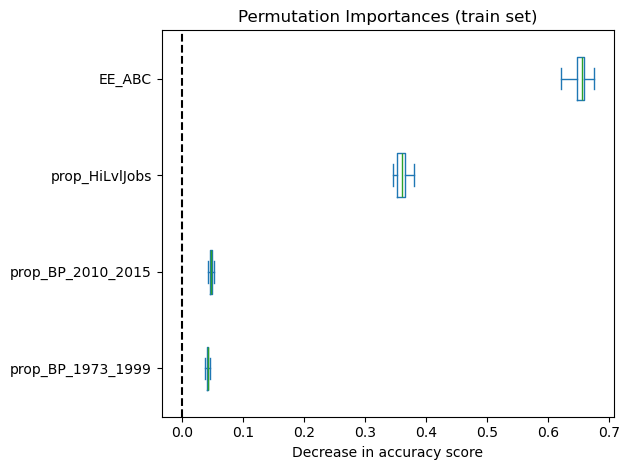

In [264]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

### RF with neighbour's y as parameter

In [265]:
coord = short_df[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
short_df_neigh = short_df.copy()
for i in range(N_NEIGHBOURS):
    short_df_neigh['neighbour' + str(i)] = short_df_neigh.index.map(lambda x: short_df_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [266]:
# prepare training & testing sets
X_neigh = short_df_neigh[covar + neigh_cols]
y_neigh = short_df_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [267]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF naighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.72726
RF test R2: 0.62520
RF naighbours Model - R²: 0.6251974208367495, MAE: 2319.5643424203313, RMSE: 3272.555014587651


In [268]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

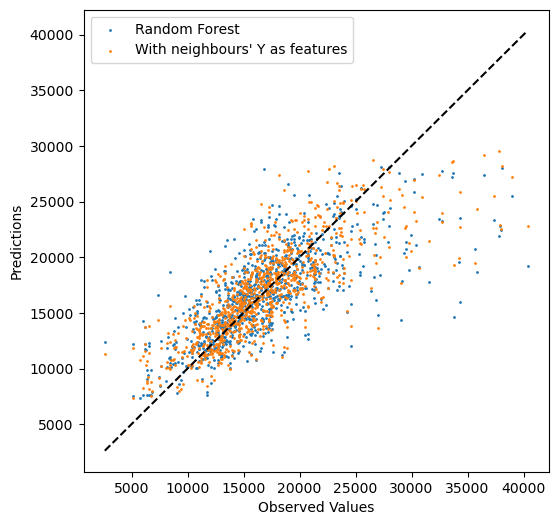

In [269]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

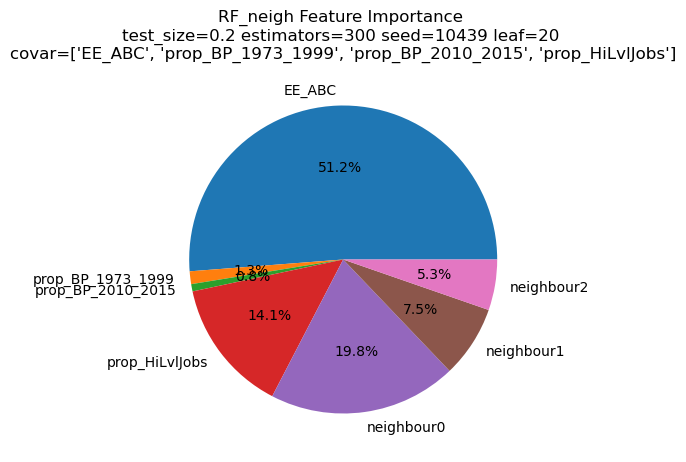

In [270]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/RF_neigh_FeatImport_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar}.png', dpi=300, bbox_inches='tight')

plt.show()

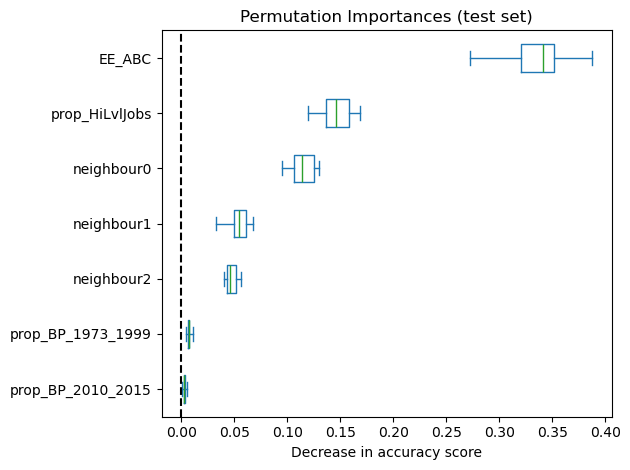

In [271]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

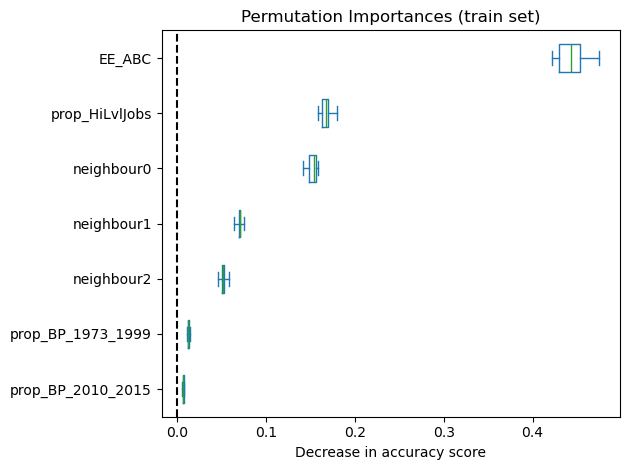

In [272]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()

In [306]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


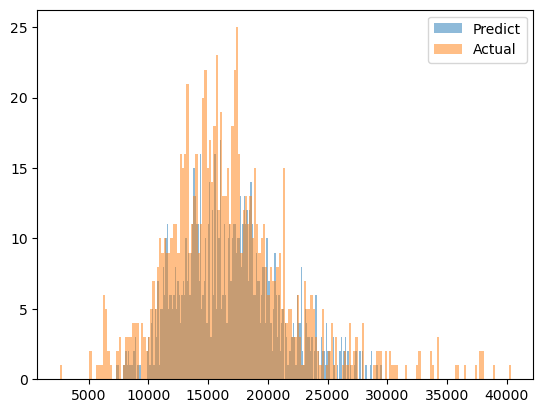

In [307]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

### Spatial RF

In [273]:
# Coordinates
rf_coords = short_df[['Latitude', 'Longitude']]
rf_coords_train = rf_coords.loc[X_train.index]
rf_coords_test = rf_coords.loc[X_test.index]

In [274]:
# spatial random forest
rf_spatial = SpatialRandomForest(n_estimators=n_est, neighbors=len(X_train)//2, min_samples_leaf=leaf) ## Nota: the // is a division with integral result (discard decimals)
rf_spatial.fit(X_train, y_train, rf_coords_train)
y_pred_spatial = rf_spatial.predict(X_test, rf_coords_test)

# print(f"RF_neigh train R2: {rf_neigh.score(X_train_neigh, y_train_neigh):.3f}") #not available for spatial RF
# print(f"RF_neigh test R2: {rf_neigh.score(X_test_neigh, y_test_neigh):.3f}")
# Model metrics
rf_spatial_r2 = r2_score(y_test, y_pred_spatial)
rf_spatial_mae = mean_absolute_error(y_test, y_pred_spatial)
rf_spatial_rmse = np.sqrt(mean_squared_error(y_test, y_pred_spatial))
print(f"RF spatial Model - R²: {rf_spatial_r2}, MAE: {rf_spatial_mae}, RMSE: {rf_spatial_rmse}")

RF spatial Model - R²: 0.5038114935022014, MAE: 2573.966229355836, RMSE: 3765.381815480432


In [275]:
# Residuals
res_rf_spatial = y_test-y_pred_spatial

### Geographical RF

In [277]:
start = time.perf_counter() # Performance counter

# geographical random forest
rf_geo = GeographicalRandomForest(n_estimators=n_est, neighbors=len(X_train)//50, n_jobs=-1, min_samples_leaf=leaf)
rf_geo.fit(X_train, y_train, rf_coords_train)
y_pred_geo = rf_geo.predict(X_test, rf_coords_test)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {elapsed_time_str}')

# print(f"RF_neigh train R2: {rf_neigh.score(X_train_neigh, y_train_neigh):.3f}") #not available for geo RF
# print(f"RF_neigh test R2: {rf_neigh.score(X_test_neigh, y_test_neigh):.3f}")
# Model metrics
rf_geo_r2 = r2_score(y_test, y_pred_geo)
rf_geo_mae = mean_absolute_error(y_test, y_pred_geo)
rf_geo_rmse = np.sqrt(mean_squared_error(y_test, y_pred_geo))
print(f"RF geo Model - R²: {rf_geo_r2}, MAE: {rf_geo_mae}, RMSE: {rf_geo_rmse}")

'\nstart = time.perf_counter() # Performance counter\n\n# geographical random forest\nrf_geo = GeographicalRandomForest(n_estimators=n_est, neighbors=len(X_train)//50, n_jobs=-1, min_samples_leaf=leaf)\nrf_geo.fit(X_train, y_train, rf_coords_train)\ny_pred_geo = rf_geo.predict(X_test, rf_coords_test)\n\n# Performance check\nend = time.perf_counter()\nelapsed_time = end - start\nelapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object \nprint(f\'Code block run in {elapsed_time_str}\')\n\n# print(f"RF_neigh train R2: {rf_neigh.score(X_train_neigh, y_train_neigh):.3f}") #not available for geo RF\n# print(f"RF_neigh test R2: {rf_neigh.score(X_test_neigh, y_test_neigh):.3f}")\n# Model metrics\nrf_geo_r2 = r2_score(y_test, y_pred_geo)\nrf_geo_mae = mean_absolute_error(y_test, y_pred_geo)\nrf_geo_rmse = np.sqrt(mean_squared_error(y_test, y_pred_geo))\nprint(f"RF geo Model - R²: {rf_geo_r2}, MAE: {rf_geo_mae}, RMSE: {rf_geo_rmse}")\n'

In [278]:
# Residuals
res_rf_geo = y_test - y_pred_geo

'\n# Residuals\nres_rf_geo = y_test - y_pred_geo\n'

In [279]:
'''
# Pie chart of feature importance # FEATURE_IMPORTANCES NOT IMPLEMENTED in SPATIAL RF AND GEO RF 
plt.figure(figsize=(5, 5))
plt.pie(rf_geo.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title('Feature Importance')
plt.show()
'''

"\n# Pie chart of feature importance\nplt.figure(figsize=(5, 5))\nplt.pie(rf_geo.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')\nplt.title('Feature Importance')\nplt.show()\n"

### Compare with OLS

In [280]:
ols_model = smf.ols(y_var+' ~ EE_ABC + prop_BP_1973_1999 + prop_BP_2010_2015 + prop_HiLvlJobs', data = df_train).fit()
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:                   ECPH   R-squared:                       0.503
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                     942.0
Date:                Thu, 09 Jan 2025   Prob (F-statistic):               0.00
Time:                        22:02:16   Log-Likelihood:                -35899.
No. Observations:                3723   AIC:                         7.181e+04
Df Residuals:                    3718   BIC:                         7.184e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept          1.519e+04    363.02

In [281]:
# Residuals
res_ols = y_test-ols_model.predict(X_test)

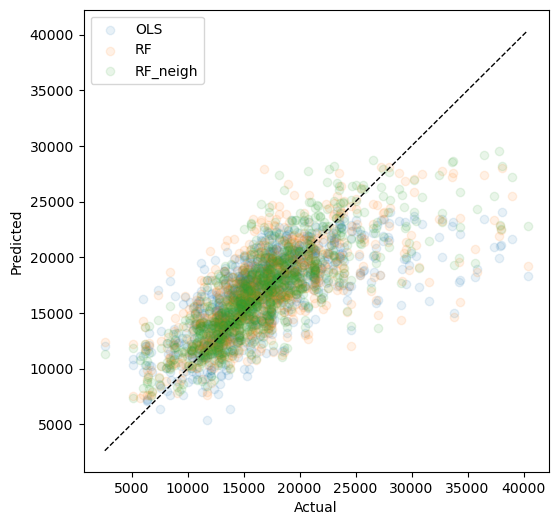

In [282]:
# Graphing both
alpha = 0.1
fig, ax = plt.subplots(1, figsize = (6,6))
plt.scatter(y_test, ols_model.predict(X_test), alpha=alpha, label='OLS')
plt.scatter(y_test, y_pred, alpha=alpha, label='RF')
plt.scatter(y_test_neigh, y_pred_neigh, alpha=alpha, label='RF_neigh')
ax.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=1)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
plt.legend()
plt.show()

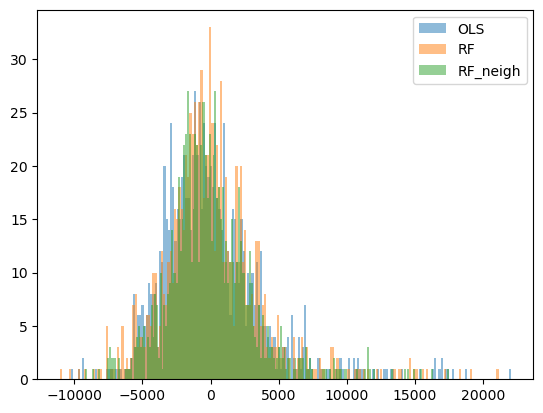

In [283]:
# Plotting residuals
fig, ax = plt.subplots()
plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [284]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [285]:
# Bandwidth selection
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference

In [286]:
gwr_bw.search() # Search optimal bw

75.0

In [287]:
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 

In [288]:
# Show results
gwr_results = gwr_model.fit()
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                3723
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       51738655654.122
Log-likelihood:                                                  -35899.145
AIC:                                                              71808.290
AICc:                                                             71810.312
BIC:                                                           51738625083.666
R2:                                                                   0.503
Adj. R2:                                                              0.503

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [289]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [290]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.6736479972271052, MAE: 2178.072220943648, RMSE: 3053.717176443352


#### MGWR

In [291]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {elapsed_time_str}')

"\nstart = time.perf_counter() # Performance counter\n# Bandwidth selection\nmgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)\nmgwr_bw = mgwr_selector.search() # Search for optimum bw\nprint(mgwr_bw)\n\n# Performance check\nend = time.perf_counter()\nelapsed_time = end - start\nelapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object \nprint(f'Code block run in {elapsed_time_str}')\n"

In [292]:
start = time.perf_counter() # Performance counter
# Build MGWR & check summary
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()
mgwr_results.summary()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {elapsed_time_str}')

"\nstart = time.perf_counter() # Performance counter\n# Build MGWR & check summary\nmgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)\nmgwr_results = mgwr_model.fit()\nmgwr_results.summary()\n\n# Performance check\nend = time.perf_counter()\nelapsed_time = end - start\nelapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object \nprint(f'Code block run in {elapsed_time_str}')\n"

In [293]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

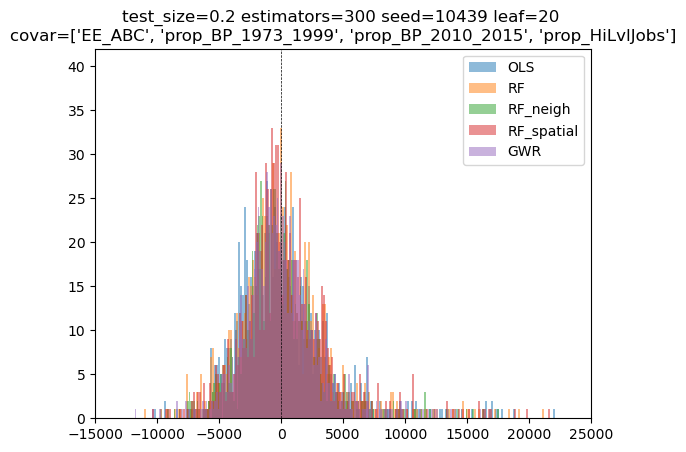

In [294]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/ModelsResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar}.png', dpi=300, bbox_inches='tight')
plt.show()

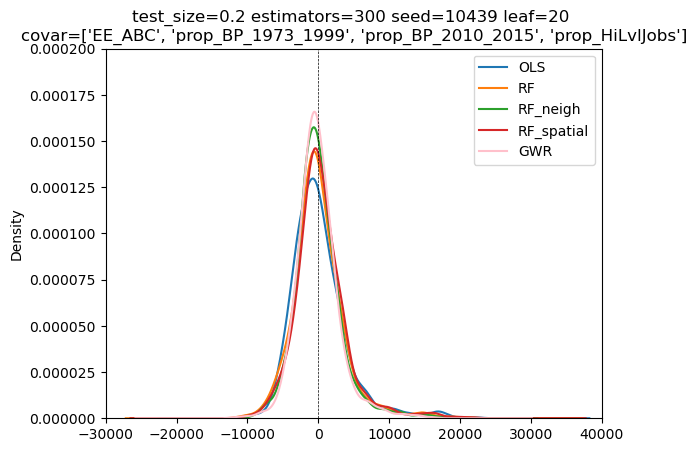

In [295]:
# kde of the residuals
fig, ax = plt.subplots(1)
res_ols.plot.kde(label='OLS')
res_rf.plot.kde(label='RF')
res_rf_neigh.plot.kde(label='RF_neigh')
res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000200)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/ModelsResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar}.png', dpi=300, bbox_inches='tight')
plt.show()

In [296]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['RF_R2_train'] = rf_R2_train
metrics_df['RF_R2_test'] = rf_R2_test
metrics_df['RF_R2'] = rf_r2
metrics_df['RF_MAE'] = rf_mae
metrics_df['RF_RMSE'] = rf_rmse
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2
metrics_df['GWR_MAE'] = gwr_mae
metrics_df['GWR_RMSE'] = gwr_rmse
# metrics_df['MGWR_R2'] = mgwr_r2
# metrics_df['MGWR_MAE'] = mgwr_mae
# metrics_df['MGWR_RMSE'] = mgwr_rmse

metrics_df.to_csv(f'output/ModelsMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,covar,RF_R2_train,RF_R2_test,RF_R2,RF_MAE,...,RF_NEIGH_RMSE,RF_SPATIAL_R2,RF_SPATIAL_MAE,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10439 ...,0.2,300,10439,20,"['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2010_...",0.619986,0.509884,0.509884,2606.045742,...,3272.555015,0.503811,2573.966229,3765.381815,NaN,NaN,NaN,0.673648,2178.072221,3053.717176


# Modelling 2 - testing additional variables

## Variables for all models - modify here for comparison runs

In [113]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = ['prop_EE_ABC', 'prop_BP_1973_1999','prop_BP_1900_1939', 'prop_BP_2000_2009', 'prop_HiLvlJobs','prop_QualUni21','PopDensKm2','HholdDensKm2','prop_HHSize3OrLess','prop_HHDepriv1OrLess','HHOccupancyPropOvercrowded' ] # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

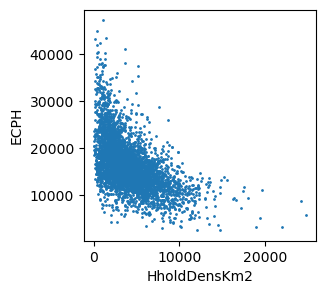

In [114]:
plt.figure(figsize=(3, 3))
plt.scatter(dataset['HholdDensKm2'], dataset['ECPH'], s=1)
plt.xlabel('HholdDensKm2')
plt.ylabel('ECPH')
plt.show()

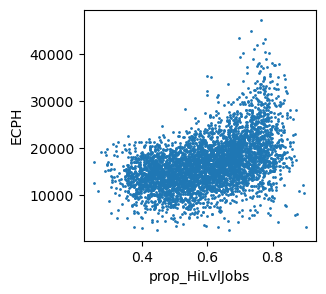

In [115]:
plt.figure(figsize=(3, 3))
plt.scatter(dataset['prop_HiLvlJobs'], dataset['ECPH'], s=1)
plt.xlabel('prop_HiLvlJobs')
plt.ylabel('ECPH')
plt.show()

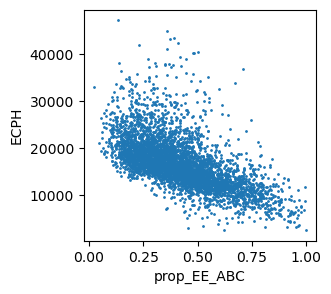

In [116]:
plt.figure(figsize=(3, 3))
plt.scatter(dataset['prop_EE_ABC'], dataset['ECPH'], s=1)
plt.xlabel('prop_EE_ABC')
plt.ylabel('ECPH')
plt.show()

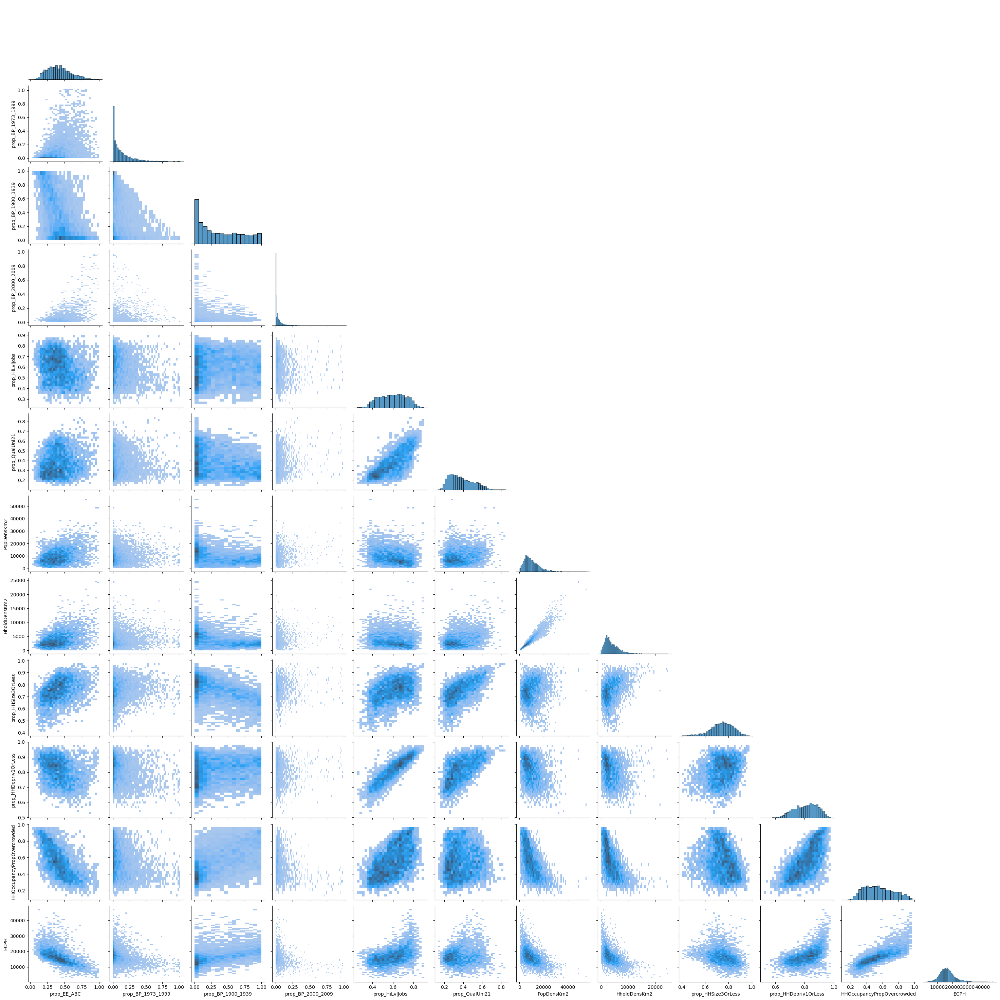

In [117]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)

In [118]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,prop_BP_1973_1999,prop_BP_1900_1939,prop_BP_2000_2009,prop_HiLvlJobs,prop_QualUni21,PopDensKm2,HholdDensKm2,prop_HHSize3OrLess,prop_HHDepriv1OrLess,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,-0.326482,0.465144,-0.281928,0.459623,0.101199,-0.523389,-0.544869,-0.321353,0.547867,0.784131
prop_EE_ABC,-0.614302,1.000000,0.402365,-0.567778,0.486329,-0.203244,0.162157,0.350110,0.411579,0.418739,-0.292735,-0.663737
prop_BP_1973_1999,-0.326482,0.402365,1.000000,-0.379498,0.065285,-0.154915,-0.073471,0.018565,0.042632,0.176212,-0.214290,-0.277638
prop_BP_1900_1939,0.465144,-0.567778,-0.379498,1.000000,-0.253863,0.046349,-0.278298,-0.347497,-0.415420,-0.503281,0.205320,0.552012
prop_BP_2000_2009,-0.281928,0.486329,0.065285,-0.253863,1.000000,-0.044832,0.096062,0.148880,0.175006,0.161387,-0.038403,-0.273180
prop_HiLvlJobs,0.459623,-0.203244,-0.154915,0.046349,-0.044832,1.000000,0.738654,-0.252055,-0.099549,0.445284,0.886354,0.563111
prop_QualUni21,0.101199,0.162157,-0.073471,-0.278298,0.096062,0.738654,1.000000,0.163706,0.320164,0.619655,0.612541,0.022307
PopDensKm2,-0.523389,0.350110,0.018565,-0.347497,0.148880,-0.252055,0.163706,1.000000,0.955206,0.158917,-0.335738,-0.597853
HholdDensKm2,-0.544869,0.411579,0.042632,-0.415420,0.175006,-0.099549,0.320164,0.955206,1.000000,0.386563,-0.226111,-0.590811
prop_HHSize3OrLess,-0.321353,0.418739,0.176212,-0.503281,0.161387,0.445284,0.619655,0.158917,0.386563,1.000000,0.251171,-0.244903


<Axes: >

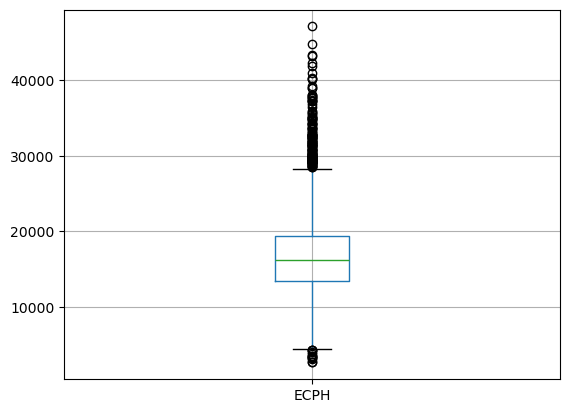

In [119]:
dataset.boxplot(column = 'ECPH')

In [120]:
dataset.loc[dataset['ECPH']>40000, ['AREA_NAME','ECPH']].sort_values(by ='ECPH', axis = 0, ascending=False)

,AREA_NAME,ECPH
269,Barnet 033F,47138.683894
2852,Kingston upon Thames 002A,44783.485987
4629,Westminster 019E,43326.140987
136,Barnet 007C,43191.191339
3292,Merton 002D,42241.994099
4104,Sutton 025D,41899.110695
4628,Westminster 019A,40959.727789
1127,Croydon 038E,40348.491239
4627,Westminster 018D,40226.680143
1405,Enfield 011D,40166.285577


## Machine Learning

In [121]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [122]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.82973
RF test R2: 0.78741
RF Model - R²: 0.7874123722218196, MAE: 1662.8182049761326, RMSE: 2381.6787496876327


In [123]:
# Residuals
res_rf = y_test-y_pred

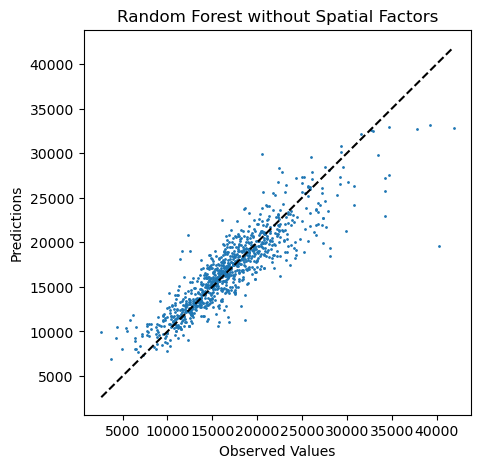

In [124]:
# Check predictions against test set
plt.figure(figsize=(5, 5))
plt.scatter(y_test, y_pred, s=1)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.title('Random Forest without Spatial Factors')
plt.show()

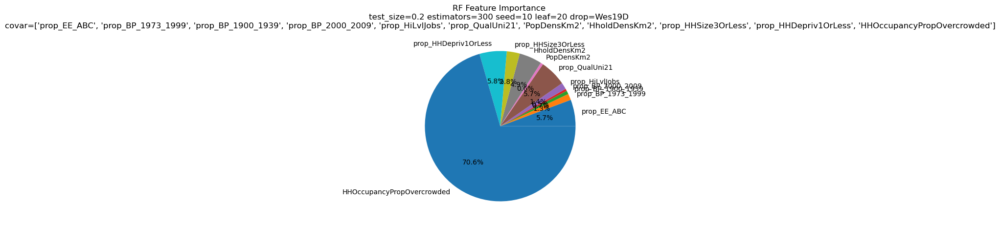

In [125]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

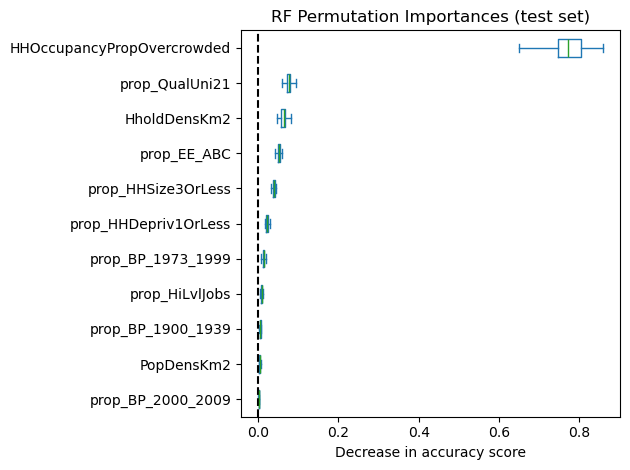

In [126]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

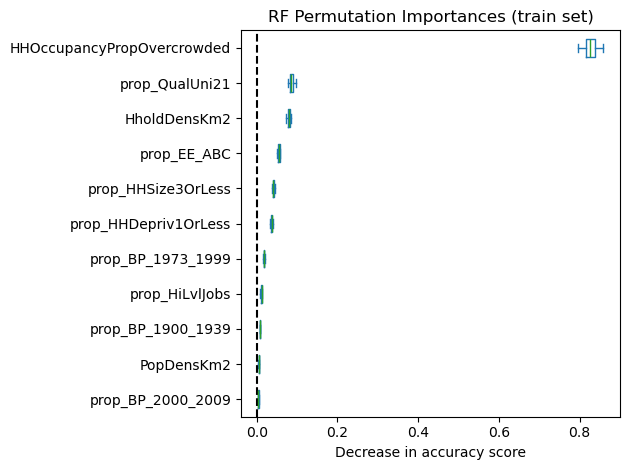

In [127]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

### RF with neighbour's y as parameter

In [128]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [129]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [130]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.84033
RF test R2: 0.79890
RF neighbours Model - R²: 0.7988959985140048, MAE: 1615.8035361909149, RMSE: 2316.458610929033


In [131]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

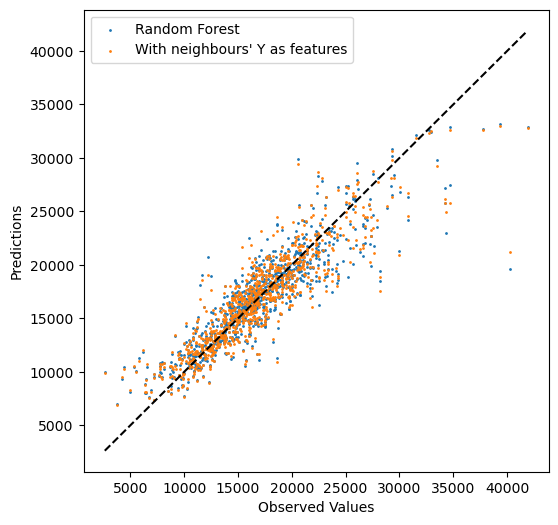

In [132]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

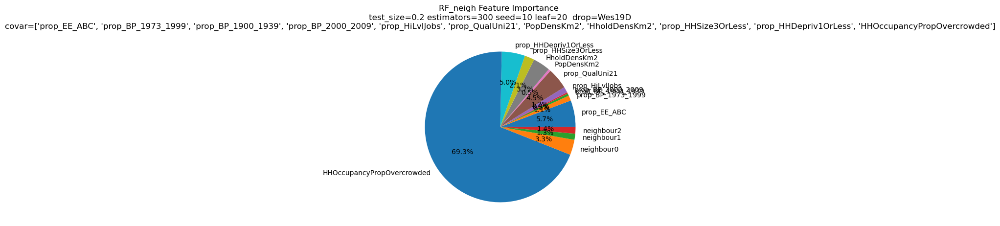

In [133]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

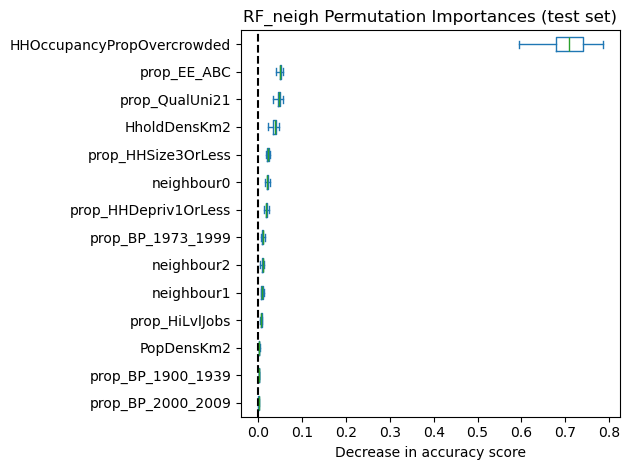

In [134]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

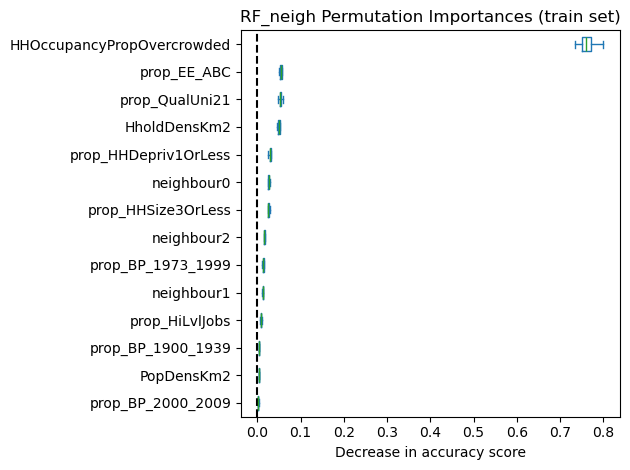

In [135]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

In [136]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


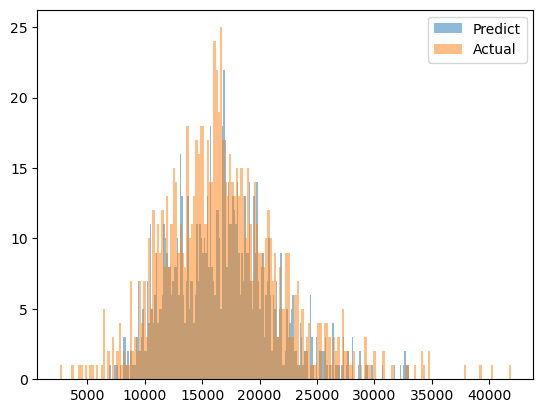

In [137]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [61]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [62]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:28.247514


In [63]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                    11

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       29409876581.117
Log-likelihood:                                                  -34838.771
AIC:                                                              69699.541
AICc:                                                             69701.625
BIC:                                                           29409846069.214
R2:                                                                   0.718
Adj. R2:                                                              0.717

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [64]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [65]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.8366694465543331, MAE: 1526.3304340460456, RMSE: 2087.6029682691596


#### MGWR

In [66]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

In [ ]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)')

In [ ]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

In [ ]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/VarTest_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/VarTest_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/VarTest_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

# **SECTION 2**: variables selection

# VIF & variables for NEW PARAMETERS ASSEMBLAGES

In [12]:
# VIF for (1) full shebang set
varset01 = ['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_BP_1900_1939', 'prop_BP_2000_2009', 'prop_HiLvlJobs', 'prop_QualUni21', 'PopDensKm2', 'HholdDensKm2', 'prop_HHSize3OrLess', 'prop_HHDepriv1OrLess', 'HHOccupancyPropOvercrowded']

y= short_df['ECPH']
X= short_df[varset01]

vif = pd.DataFrame() #new dataframe
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])] # Calculate VIF and store in a new column name 'VIF'
vif['variable'] = X.columns # Create a new column named 'variable' and store the names of the variables
print(f'VIF range {vif['VIF'].min():.1f} - {vif['VIF'].max():.1f}')
vif

VIF range 1.8 - 419.5


,VIF,variable
0,18.223006,prop_EE_ABC
1,2.293229,prop_BP_1973_1999
2,4.904084,prop_BP_1900_1939
3,1.763448,prop_BP_2000_2009
4,200.615127,prop_HiLvlJobs
5,51.114261,prop_QualUni21
6,82.303746,PopDensKm2
7,84.832225,HholdDensKm2
8,163.738922,prop_HHSize3OrLess
9,419.486937,prop_HHDepriv1OrLess


In [13]:
# VIF for (2) Vars Removed with Low Permutation Importance
varset02 = ['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_HiLvlJobs', 'prop_QualUni21', 'HholdDensKm2','prop_HHSize3OrLess','prop_HHDepriv1OrLess','HHOccupancyPropOvercrowded' ]

y= short_df['ECPH']
X= short_df[varset02]

vif = pd.DataFrame() #new dataframe
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])] # Calculate VIF and store in a new column name 'VIF'
vif['variable'] = X.columns # Create a new column named 'variable' and store the names of the variables
print(f'VIF range {vif['VIF'].min():.1f} - {vif['VIF'].max():.1f}')
vif

VIF range 2.1 - 235.1


,VIF,variable
0,14.941595,prop_EE_ABC
1,2.113856,prop_BP_1973_1999
2,179.405617,prop_HiLvlJobs
3,48.482476,prop_QualUni21
4,5.981104,HholdDensKm2
5,121.508838,prop_HHSize3OrLess
6,235.105130,prop_HHDepriv1OrLess
7,68.689748,HHOccupancyPropOvercrowded


In [14]:
# VIF for (3) No Overcrowd set - testing the effect on coefficients and variables importance
varset03 = ['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_HiLvlJobs', 'prop_QualUni21', 'HholdDensKm2','prop_HHSize3OrLess','prop_HHDepriv1OrLess']

y= short_df['ECPH']
X= short_df[varset03]

vif = pd.DataFrame() #new dataframe
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])] # Calculate VIF and store in a new column name 'VIF'
vif['variable'] = X.columns # Create a new column named 'variable' and store the names of the variables
print(f'VIF range {vif['VIF'].min():.1f} - {vif['VIF'].max():.1f}')
vif

VIF range 2.1 - 134.4


,VIF,variable
0,12.479619,prop_EE_ABC
1,2.112045,prop_BP_1973_1999
2,134.409871,prop_HiLvlJobs
3,35.965835,prop_QualUni21
4,5.479284,HholdDensKm2
5,110.205066,prop_HHSize3OrLess
6,132.627072,prop_HHDepriv1OrLess


In [15]:
# VIF for (4) VIF Minimisation Set 01
varset04 = ['prop_EE_ABC', 'HholdDensKm2','HHOccupancyPropOvercrowded']

y= short_df['ECPH']
X= short_df[varset04]

vif = pd.DataFrame() #new dataframe
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])] # Calculate VIF and store in a new column name 'VIF'
vif['variable'] = X.columns # Create a new column named 'variable' and store the names of the variables
print(f'VIF range {vif['VIF'].min():.1f} - {vif['VIF'].max():.1f}')
vif

VIF range 2.7 - 5.3


,VIF,variable
0,5.299179,prop_EE_ABC
1,3.699077,HholdDensKm2
2,2.712486,HHOccupancyPropOvercrowded


In [16]:
# VIF for (5) VIF Minimisation Set 02
varset05 = ['prop_EE_ABC', 'prop_HiLvlJobs', 'HholdDensKm2']

y= short_df['ECPH']
X= short_df[varset05]

vif = pd.DataFrame() #new dataframe
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])] # Calculate VIF and store in a new column name 'VIF'
vif['variable'] = X.columns # Create a new column named 'variable' and store the names of the variables
print(f'VIF range {vif['VIF'].min():.1f} - {vif['VIF'].max():.1f}')
vif

VIF range 3.8 - 6.3


,VIF,variable
0,6.293865,prop_EE_ABC
1,4.741797,prop_HiLvlJobs
2,3.831198,HholdDensKm2


In [17]:
# VIF for (6) Fine tuning after 1-5 comparisons
varset02 = ['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_HiLvlJobs', 'prop_QualUni21', 'HholdDensKm2','prop_HHSize3OrLess','prop_HHDepriv1OrLess','HHOccupancyPropOvercrowded' ]
varset06 = ['prop_EE_ABC', 'prop_QualUni21', 'HholdDensKm2','HHOccupancyPropOvercrowded' ]

y= short_df['ECPH']
X= short_df[varset06]

vif = pd.DataFrame() #new dataframe
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])] # Calculate VIF and store in a new column name 'VIF'
vif['variable'] = X.columns # Create a new column named 'variable' and store the names of the variables
print(f'VIF range {vif['VIF'].min():.1f} - {vif['VIF'].max():.1f}')
vif

VIF range 4.7 - 13.2


,VIF,variable
0,6.058034,prop_EE_ABC
1,13.190766,prop_QualUni21
2,4.748848,HholdDensKm2
3,6.290420,HHOccupancyPropOvercrowded


In [19]:
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index()

In [20]:
dataset[['ECPH']+varset01].corr()

,ECPH,prop_EE_ABC,prop_BP_1973_1999,prop_BP_1900_1939,prop_BP_2000_2009,prop_HiLvlJobs,prop_QualUni21,PopDensKm2,HholdDensKm2,prop_HHSize3OrLess,prop_HHDepriv1OrLess,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,-0.326482,0.465144,-0.281928,0.459623,0.101199,-0.523389,-0.544869,-0.321353,0.547867,0.784131
prop_EE_ABC,-0.614302,1.000000,0.402365,-0.567778,0.486329,-0.203244,0.162157,0.350110,0.411579,0.418739,-0.292735,-0.663737
prop_BP_1973_1999,-0.326482,0.402365,1.000000,-0.379498,0.065285,-0.154915,-0.073471,0.018565,0.042632,0.176212,-0.214290,-0.277638
prop_BP_1900_1939,0.465144,-0.567778,-0.379498,1.000000,-0.253863,0.046349,-0.278298,-0.347497,-0.415420,-0.503281,0.205320,0.552012
prop_BP_2000_2009,-0.281928,0.486329,0.065285,-0.253863,1.000000,-0.044832,0.096062,0.148880,0.175006,0.161387,-0.038403,-0.273180
prop_HiLvlJobs,0.459623,-0.203244,-0.154915,0.046349,-0.044832,1.000000,0.738654,-0.252055,-0.099549,0.445284,0.886354,0.563111
prop_QualUni21,0.101199,0.162157,-0.073471,-0.278298,0.096062,0.738654,1.000000,0.163706,0.320164,0.619655,0.612541,0.022307
PopDensKm2,-0.523389,0.350110,0.018565,-0.347497,0.148880,-0.252055,0.163706,1.000000,0.955206,0.158917,-0.335738,-0.597853
HholdDensKm2,-0.544869,0.411579,0.042632,-0.415420,0.175006,-0.099549,0.320164,0.955206,1.000000,0.386563,-0.226111,-0.590811
prop_HHSize3OrLess,-0.321353,0.418739,0.176212,-0.503281,0.161387,0.445284,0.619655,0.158917,0.386563,1.000000,0.251171,-0.244903


In [ ]:
dataset.boxplot(column='prop_HHDepriv1OrLess')
plt.show()

In [31]:
len(dataset)

4653

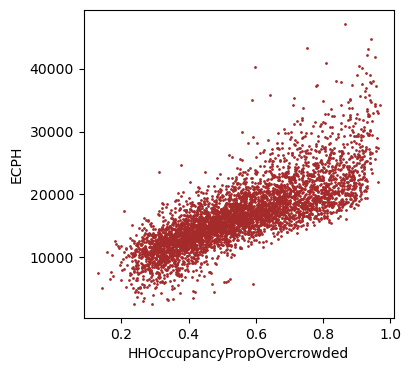

In [30]:
fig,ax = plt.subplots(1,1,figsize = (4,4))
ax.scatter(dataset['HHOccupancyPropOvercrowded'], dataset['ECPH'], c = 'brown', s=1)
ax.set_ylabel('ECPH')
ax.set_xlabel('HHOccupancyPropOvercrowded')
plt.savefig(f'output/ScatterECPH-Occupancy.png', dpi=300, bbox_inches='tight')
plt.show()

# Modelling 3 - testing var assemblage (1) full shebang set  
I could have rewritten the 5 sections below as a function to iterate over, but I couldn't be asked.

## Variables for all models - modify here for comparison runs

In [87]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '01' # assemblage number (for file names)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset01 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

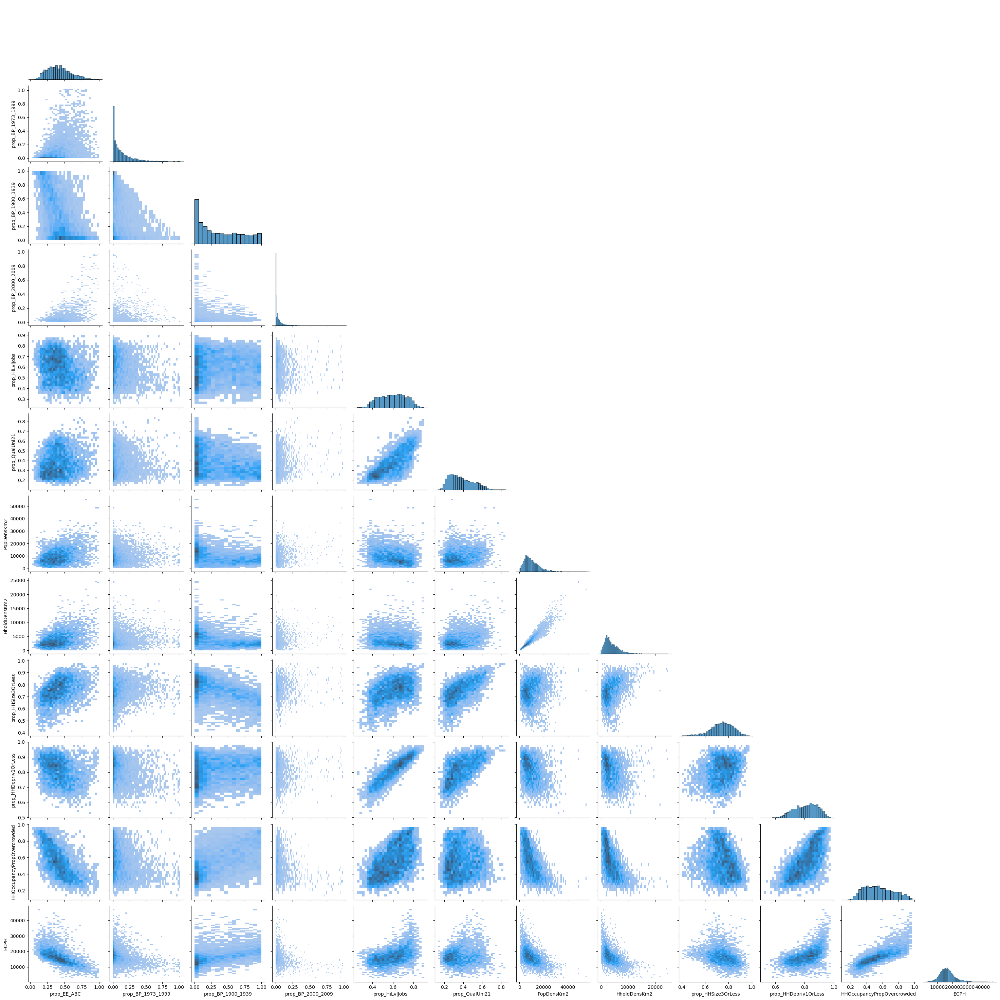

In [73]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)

In [74]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,prop_BP_1973_1999,prop_BP_1900_1939,prop_BP_2000_2009,prop_HiLvlJobs,prop_QualUni21,PopDensKm2,HholdDensKm2,prop_HHSize3OrLess,prop_HHDepriv1OrLess,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,-0.326482,0.465144,-0.281928,0.459623,0.101199,-0.523389,-0.544869,-0.321353,0.547867,0.784131
prop_EE_ABC,-0.614302,1.000000,0.402365,-0.567778,0.486329,-0.203244,0.162157,0.350110,0.411579,0.418739,-0.292735,-0.663737
prop_BP_1973_1999,-0.326482,0.402365,1.000000,-0.379498,0.065285,-0.154915,-0.073471,0.018565,0.042632,0.176212,-0.214290,-0.277638
prop_BP_1900_1939,0.465144,-0.567778,-0.379498,1.000000,-0.253863,0.046349,-0.278298,-0.347497,-0.415420,-0.503281,0.205320,0.552012
prop_BP_2000_2009,-0.281928,0.486329,0.065285,-0.253863,1.000000,-0.044832,0.096062,0.148880,0.175006,0.161387,-0.038403,-0.273180
prop_HiLvlJobs,0.459623,-0.203244,-0.154915,0.046349,-0.044832,1.000000,0.738654,-0.252055,-0.099549,0.445284,0.886354,0.563111
prop_QualUni21,0.101199,0.162157,-0.073471,-0.278298,0.096062,0.738654,1.000000,0.163706,0.320164,0.619655,0.612541,0.022307
PopDensKm2,-0.523389,0.350110,0.018565,-0.347497,0.148880,-0.252055,0.163706,1.000000,0.955206,0.158917,-0.335738,-0.597853
HholdDensKm2,-0.544869,0.411579,0.042632,-0.415420,0.175006,-0.099549,0.320164,0.955206,1.000000,0.386563,-0.226111,-0.590811
prop_HHSize3OrLess,-0.321353,0.418739,0.176212,-0.503281,0.161387,0.445284,0.619655,0.158917,0.386563,1.000000,0.251171,-0.244903


## Machine Learning

In [104]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [105]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.82986
RF test R2: 0.78818
RF Model - R²: 0.7881799839251462, MAE: 1658.3797237432702, RMSE: 2377.374976678817


In [106]:
# Residuals
res_rf = y_test-y_pred

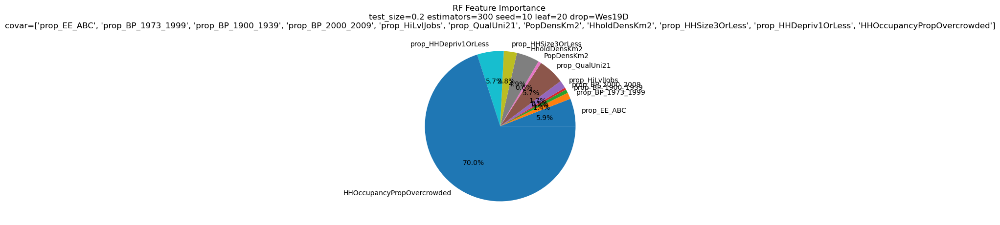

In [107]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

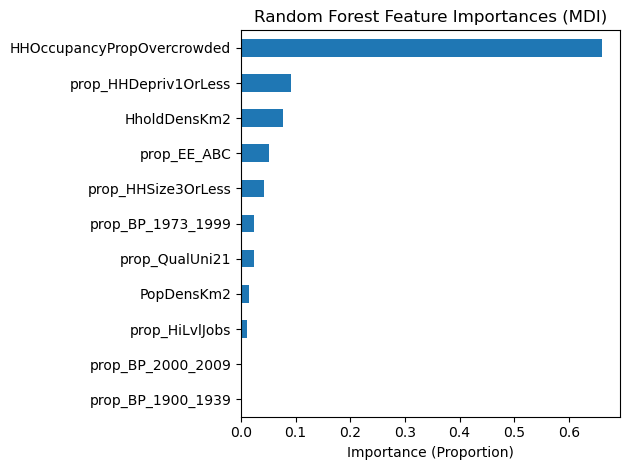

In [108]:
feature_names = X_train.columns
mdi_importances = pd.Series( rf[-1].feature_importances_, index=feature_names ).sort_values(ascending=True)
ax = mdi_importances.plot.barh() 
ax.set_title("Random Forest Feature Importances (MDI)") 
ax.set_xlabel("Importance (Proportion)")
ax.figure.tight_layout()
plt.savefig(f'output/comp_FeatBarImp/VarTest_RF_FeatImp_varset{asnr}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

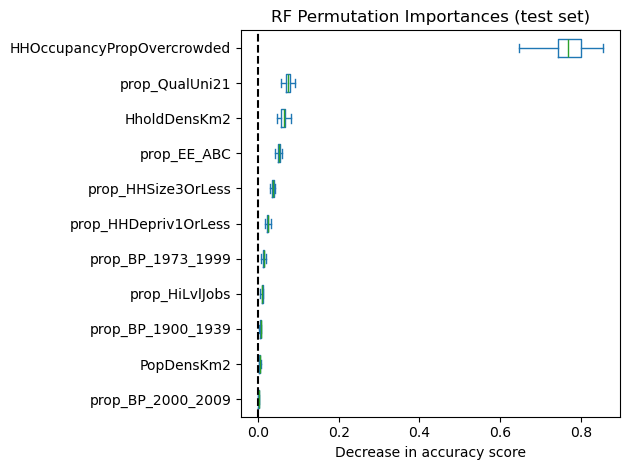

In [109]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTst_varset{asnr}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

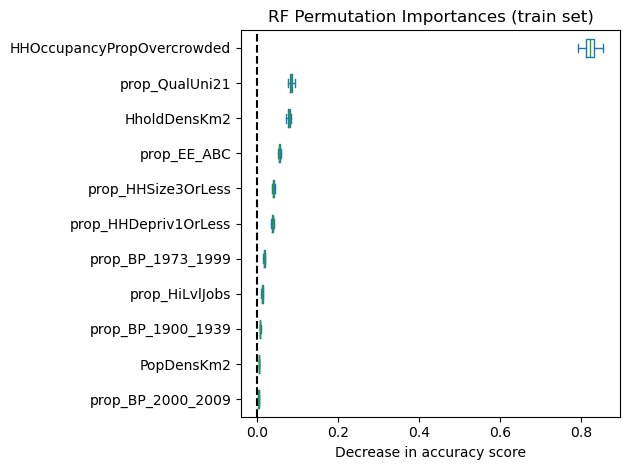

In [110]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTra_varset{asnr}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

### RF with neighbour's y as parameter

In [95]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [96]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [97]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.84059
RF test R2: 0.79862
RF neighbours Model - R²: 0.7986177053795953, MAE: 1621.4866930567694, RMSE: 2318.060845728956


In [98]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

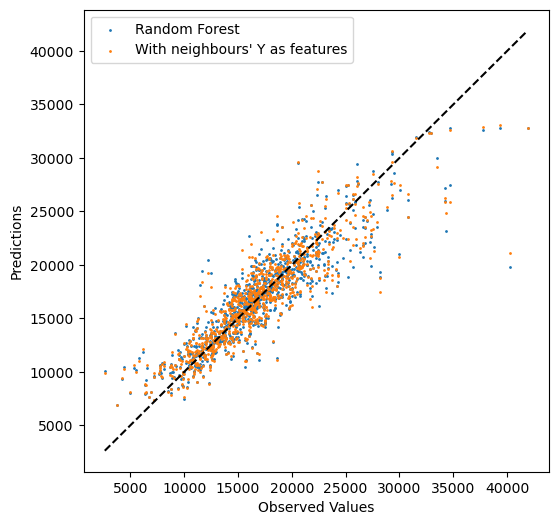

In [99]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

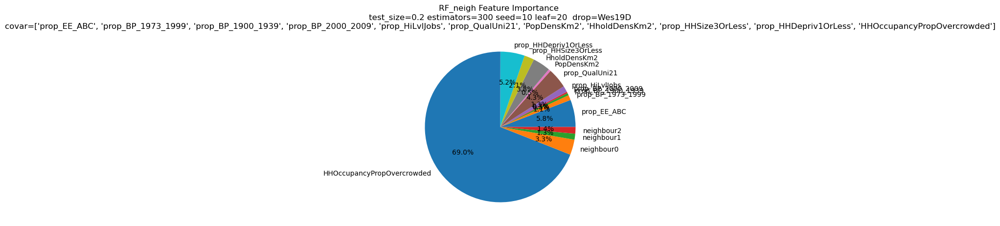

In [100]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

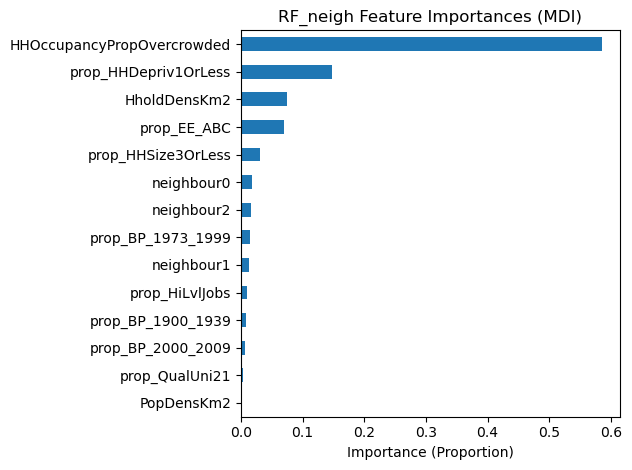

In [101]:
feature_names = X_train_neigh.columns
mdi_importances = pd.Series( rf_neigh[-1].feature_importances_, index=feature_names ).sort_values(ascending=True)
ax = mdi_importances.plot.barh() 
ax.set_title("RF_neigh Feature Importances (MDI)") 
ax.set_xlabel("Importance (Proportion)")
ax.figure.tight_layout()
plt.savefig(f'output/comp_FeatBarImp/VarTest_RFn_FeatImp_varset{asnr}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

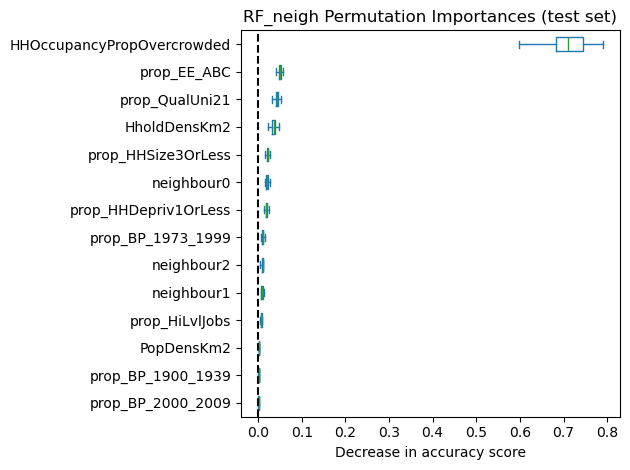

In [102]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTst_varset{asnr}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

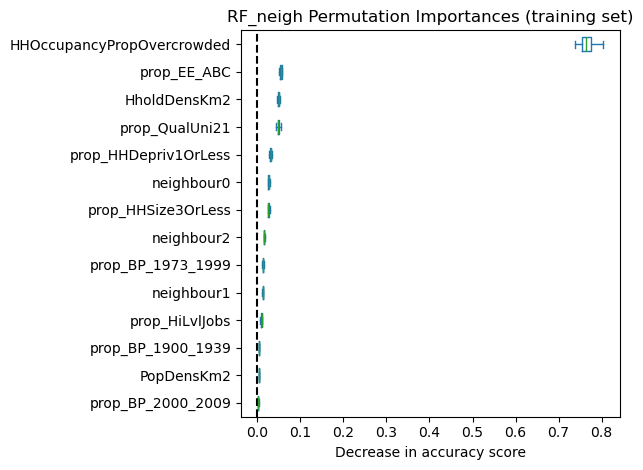

In [103]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (training set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTra_varset{asnr}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

## GWR & MGWR

#### GWR

In [43]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [44]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:16.665344


In [45]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                    12

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       29560806034.924
Log-likelihood:                                                  -34848.297
AIC:                                                              69720.593
AICc:                                                             69722.691
BIC:                                                           29560775531.243
R2:                                                                   0.716
Adj. R2:                                                              0.716

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [46]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

In [47]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [48]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.8413940210574703, MAE: 1508.7597804551822, RMSE: 2057.1879238793504


#### MGWR

In [97]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[3721. 3721. 1224.  755.  506. 3721. 3721.  288. 3719. 3721. 3721.   43.]
Code block run in 3:28:17.088022


In [98]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 1:16:14.364611


In [100]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                    12

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       29560806034.924
Log-likelihood:                                                  -34848.297
AIC:                                                              69720.593
AICc:                                                             69722.691
BIC:                                                           29560775531.243
R2:                                                                   0.716
Adj. R2:                                                              0.716

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [101]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

In [102]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

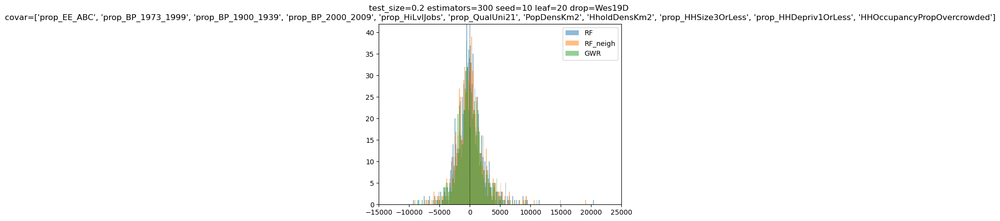

In [103]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/VarTest_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

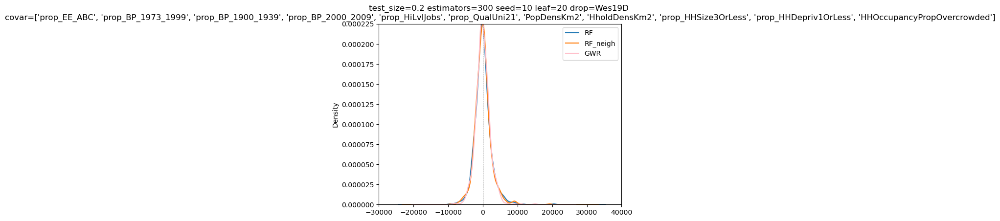

In [104]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/VarTest_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [107]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/VarTest_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,covar,drop,RF_R2_train,RF_R2_test,RF_R2,...,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE,MGWR_R2,MGWR_MAE,MGWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10 lea...,0.2,300,10,20,"['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_BP_...",['Westminster 019D'],0.829718,0.787758,0.787758,...,NaN,NaN,NaN,NaN,0.841394,1508.75978,2057.187924,NaN,NaN,NaN


# Modelling 4 - testing var assemblage (2) Vars Removed with Low Permutation Importance set

## Variables for all models - modify here for comparison runs

In [49]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '02' # assemblage number (for file names)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset02 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

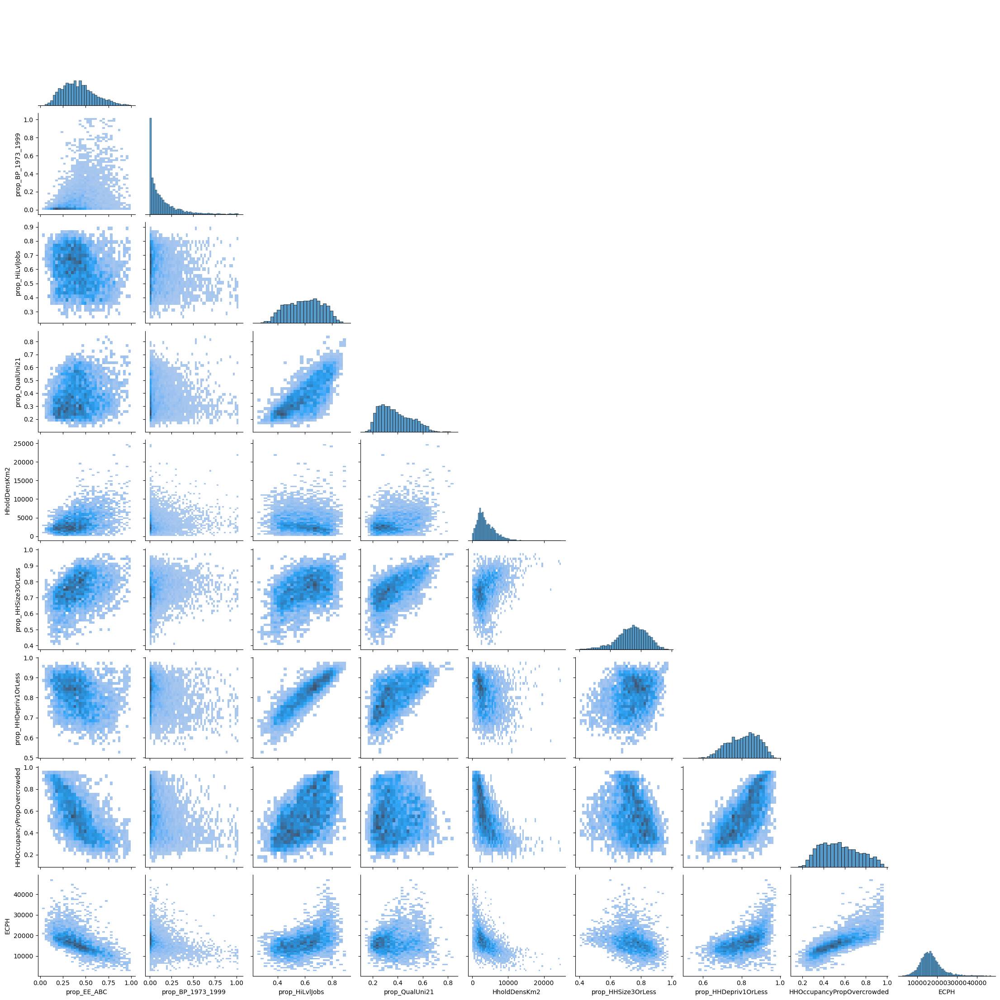

In [109]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)

In [110]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,prop_BP_1973_1999,prop_HiLvlJobs,prop_QualUni21,HholdDensKm2,prop_HHSize3OrLess,prop_HHDepriv1OrLess,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,-0.326482,0.459623,0.101199,-0.544869,-0.321353,0.547867,0.784131
prop_EE_ABC,-0.614302,1.000000,0.402365,-0.203244,0.162157,0.411579,0.418739,-0.292735,-0.663737
prop_BP_1973_1999,-0.326482,0.402365,1.000000,-0.154915,-0.073471,0.042632,0.176212,-0.214290,-0.277638
prop_HiLvlJobs,0.459623,-0.203244,-0.154915,1.000000,0.738654,-0.099549,0.445284,0.886354,0.563111
prop_QualUni21,0.101199,0.162157,-0.073471,0.738654,1.000000,0.320164,0.619655,0.612541,0.022307
HholdDensKm2,-0.544869,0.411579,0.042632,-0.099549,0.320164,1.000000,0.386563,-0.226111,-0.590811
prop_HHSize3OrLess,-0.321353,0.418739,0.176212,0.445284,0.619655,0.386563,1.000000,0.251171,-0.244903
prop_HHDepriv1OrLess,0.547867,-0.292735,-0.214290,0.886354,0.612541,-0.226111,0.251171,1.000000,0.676922
HHOccupancyPropOvercrowded,0.784131,-0.663737,-0.277638,0.563111,0.022307,-0.590811,-0.244903,0.676922,1.000000


## Machine Learning

In [111]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [112]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.82674
RF test R2: 0.78514
RF Model - R²: 0.7851362411788564, MAE: 1664.4193553443192, RMSE: 2394.3948699660245


In [113]:
# Residuals
res_rf = y_test-y_pred

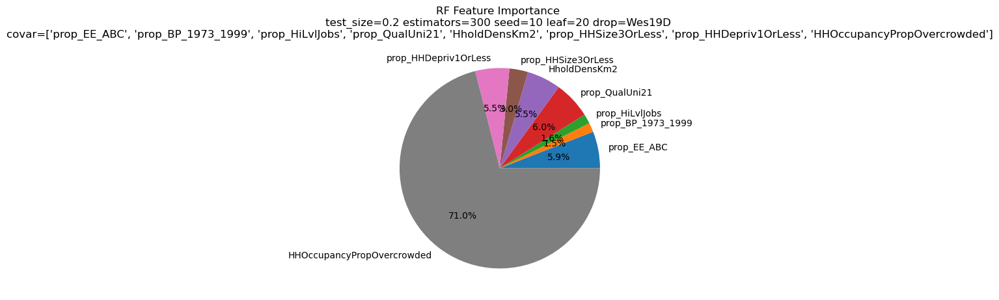

In [114]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

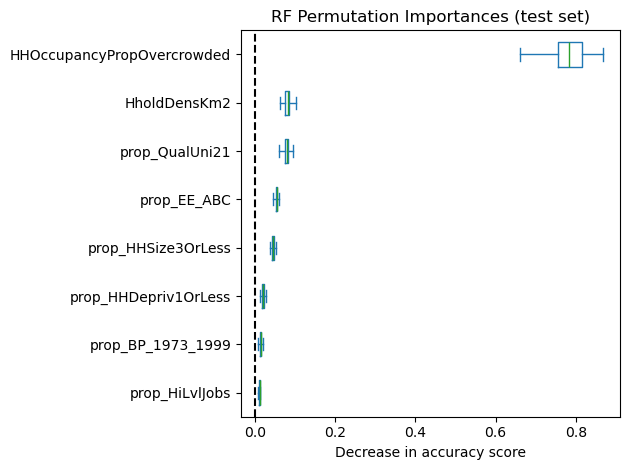

In [115]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

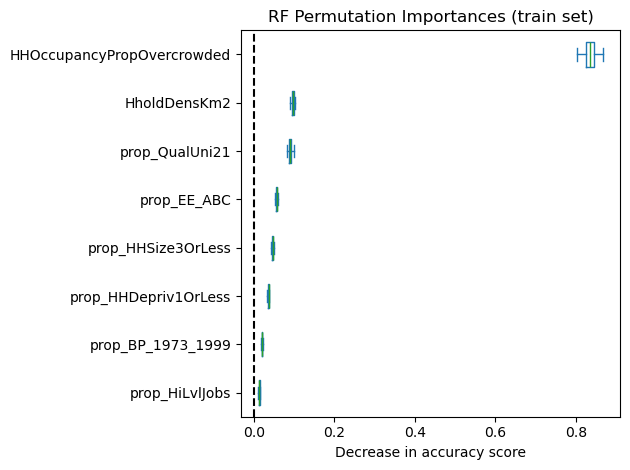

In [116]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

### RF with neighbour's y as parameter

In [117]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [118]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [119]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.83844
RF test R2: 0.79992
RF neighbours Model - R²: 0.799924705932753, MAE: 1612.866771709648, RMSE: 2310.526323787467


In [120]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

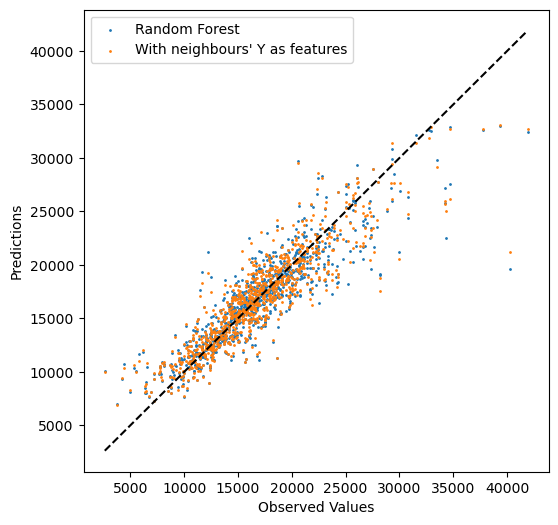

In [121]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

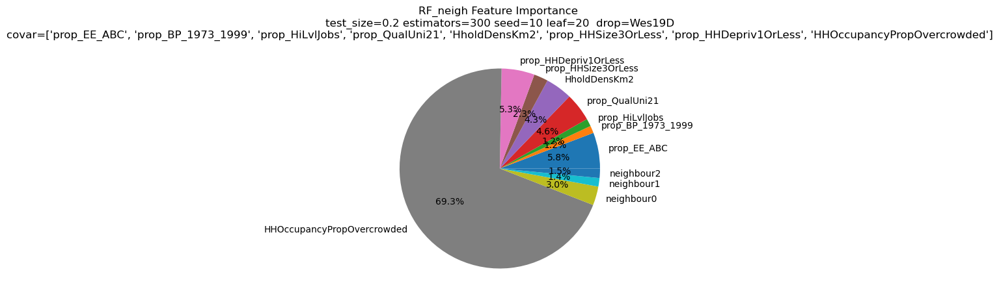

In [122]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

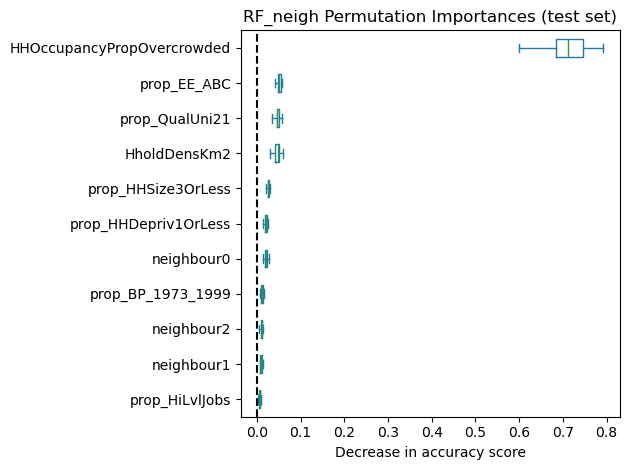

In [123]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

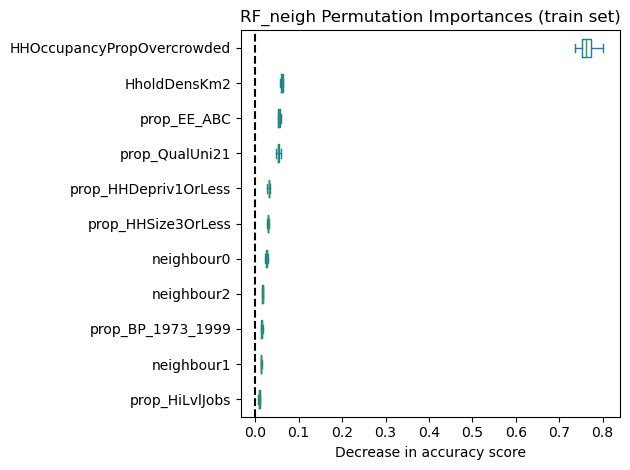

In [124]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

In [125]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


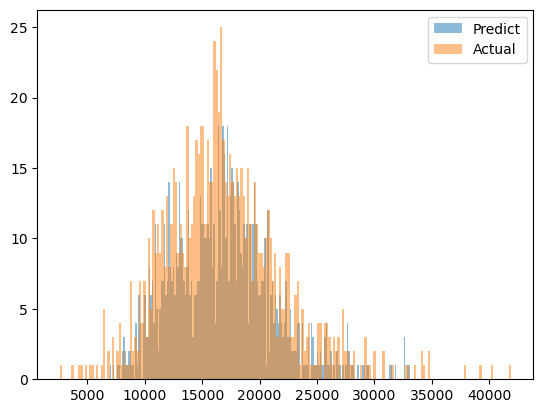

In [126]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [50]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [51]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:14.748257


In [52]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       29889762992.612
Log-likelihood:                                                  -34868.892
AIC:                                                              69755.783
AICc:                                                             69757.843
BIC:                                                           29889732464.265
R2:                                                                   0.713
Adj. R2:                                                              0.713

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [53]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

In [54]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [55]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.8441645468980368, MAE: 1492.602155715031, RMSE: 2039.141309933304


#### MGWR

In [133]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[3721. 3721. 1071. 3721. 3721.  282. 3721. 3721.   43.]
Code block run in 3:42:11.009324


In [134]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 1:05:56.128734


In [135]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       29889762992.612
Log-likelihood:                                                  -34868.892
AIC:                                                              69755.783
AICc:                                                             69757.843
BIC:                                                           29889732464.265
R2:                                                                   0.713
Adj. R2:                                                              0.713

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [136]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

In [137]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

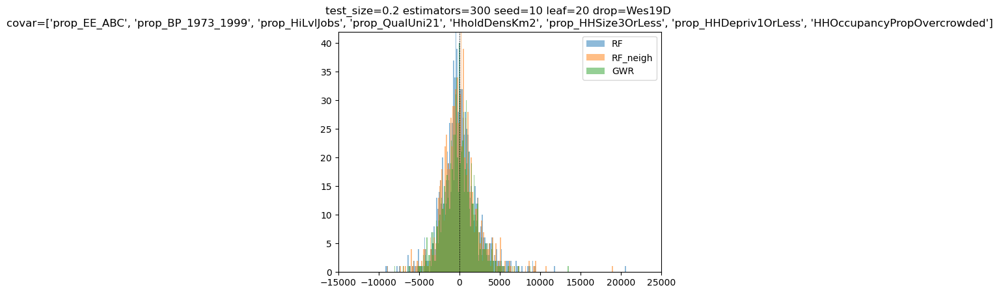

In [138]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/VarTest_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

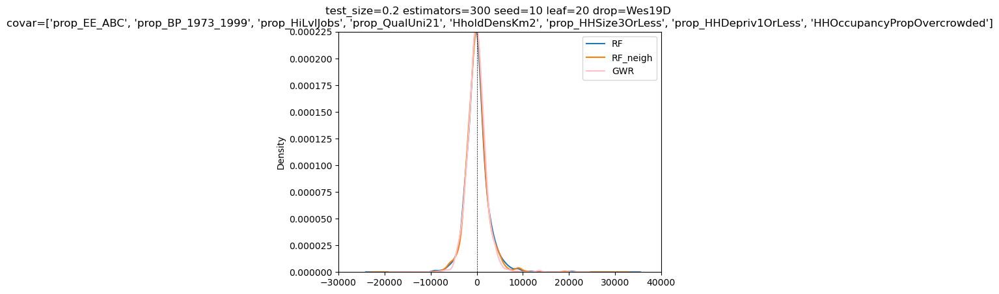

In [139]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/VarTest_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [140]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/VarTest_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,covar,drop,RF_R2_train,RF_R2_test,RF_R2,...,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE,MGWR_R2,MGWR_MAE,MGWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10 lea...,0.2,300,10,20,"['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_HiL...",['Westminster 019D'],0.826739,0.785136,0.785136,...,NaN,NaN,NaN,NaN,0.841394,1508.75978,2057.187924,NaN,NaN,NaN


# Modelling 5 - testing var assemblage (3)

## Variables for all models - modify here for comparison runs

In [56]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '03' # assemblage number (for file names)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset03 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

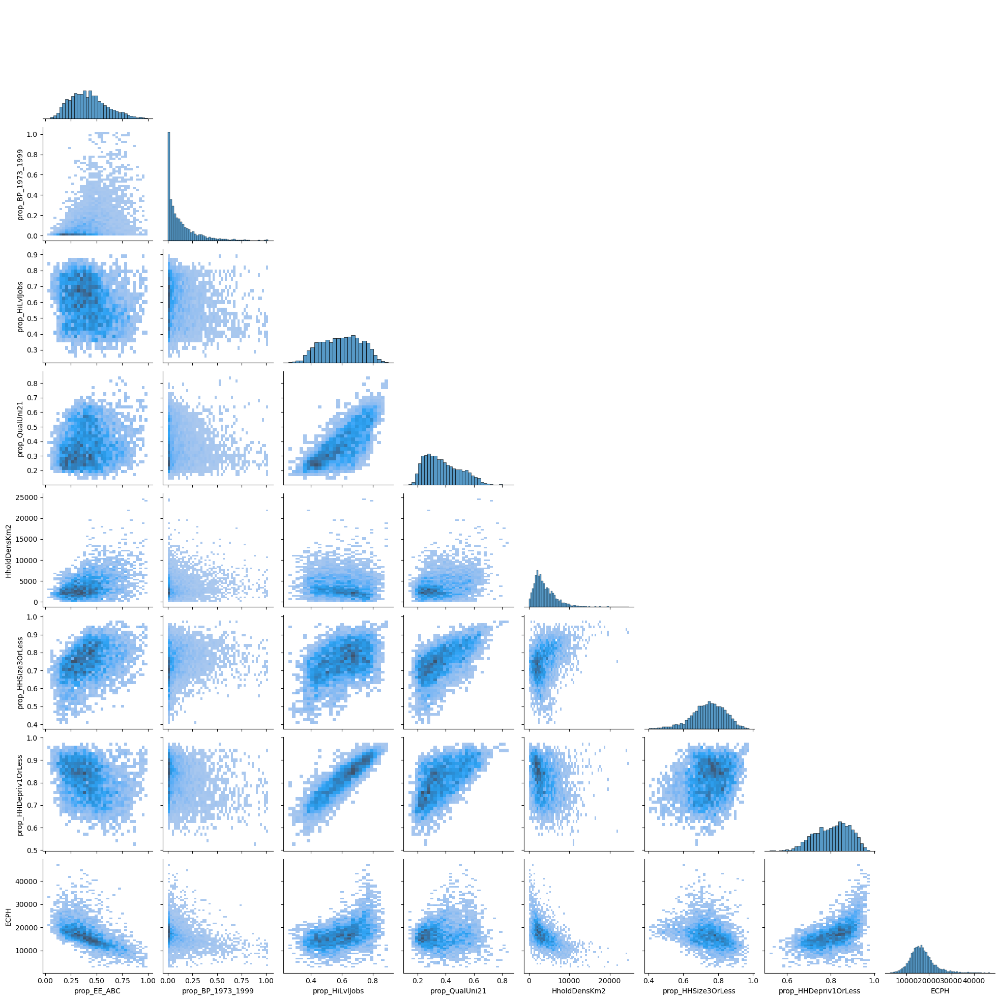

In [142]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)

In [143]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,prop_BP_1973_1999,prop_HiLvlJobs,prop_QualUni21,HholdDensKm2,prop_HHSize3OrLess,prop_HHDepriv1OrLess
ECPH,1.000000,-0.614302,-0.326482,0.459623,0.101199,-0.544869,-0.321353,0.547867
prop_EE_ABC,-0.614302,1.000000,0.402365,-0.203244,0.162157,0.411579,0.418739,-0.292735
prop_BP_1973_1999,-0.326482,0.402365,1.000000,-0.154915,-0.073471,0.042632,0.176212,-0.214290
prop_HiLvlJobs,0.459623,-0.203244,-0.154915,1.000000,0.738654,-0.099549,0.445284,0.886354
prop_QualUni21,0.101199,0.162157,-0.073471,0.738654,1.000000,0.320164,0.619655,0.612541
HholdDensKm2,-0.544869,0.411579,0.042632,-0.099549,0.320164,1.000000,0.386563,-0.226111
prop_HHSize3OrLess,-0.321353,0.418739,0.176212,0.445284,0.619655,0.386563,1.000000,0.251171
prop_HHDepriv1OrLess,0.547867,-0.292735,-0.214290,0.886354,0.612541,-0.226111,0.251171,1.000000


## Machine Learning

In [144]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [145]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.79019
RF test R2: 0.75197
RF Model - R²: 0.7519657901529363, MAE: 1778.6544407760364, RMSE: 2572.586469412246


In [146]:
# Residuals
res_rf = y_test-y_pred

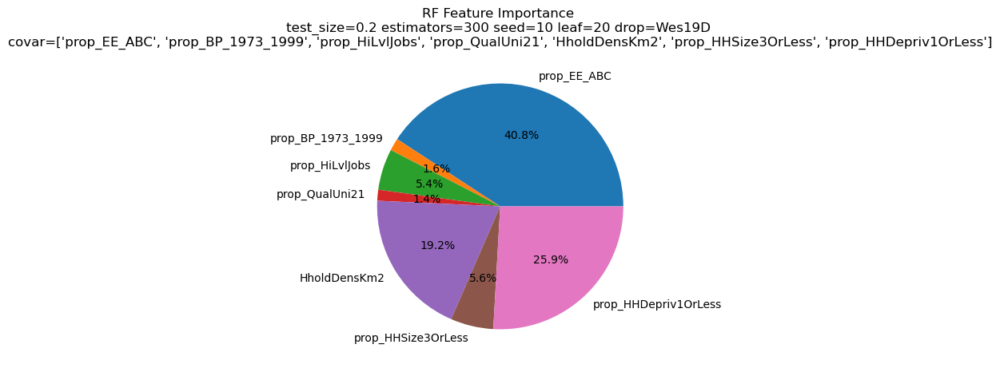

In [147]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

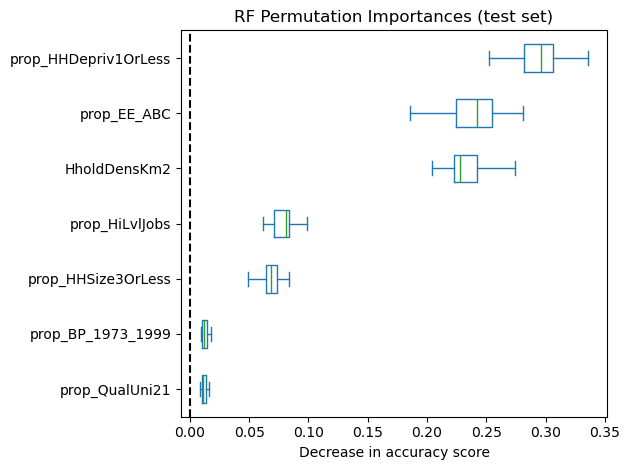

In [148]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

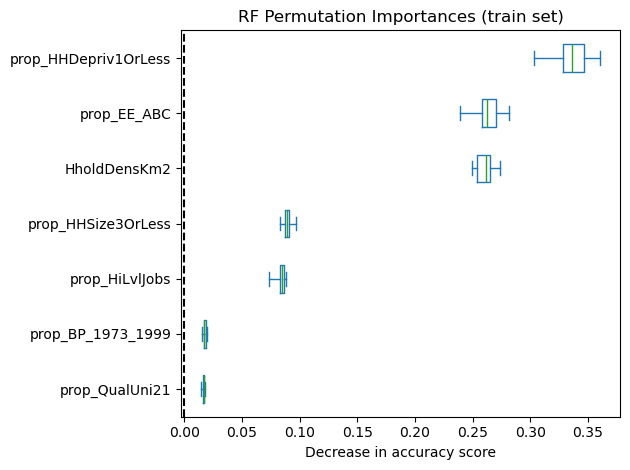

In [149]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

### RF with neighbour's y as parameter

In [150]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [151]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [152]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.80469
RF test R2: 0.76800
RF neighbours Model - R²: 0.7679972377793094, MAE: 1723.8585800681462, RMSE: 2488.0595269587657


In [153]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

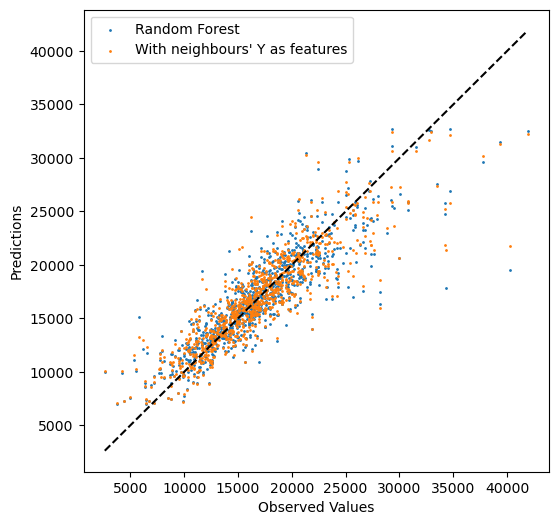

In [154]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

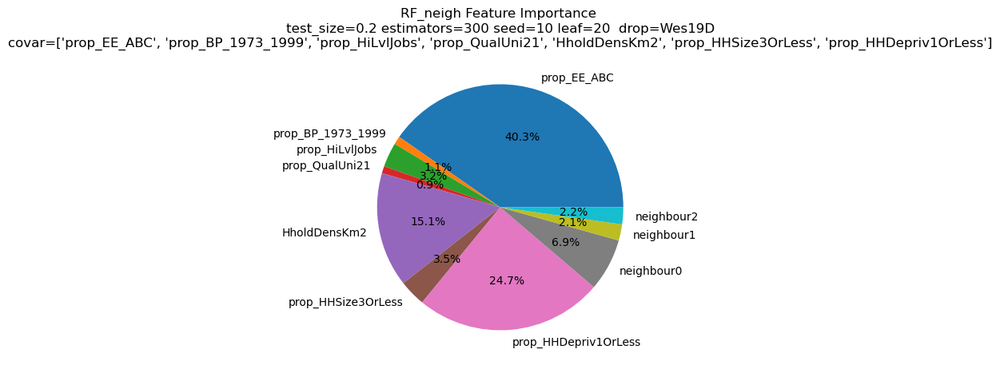

In [155]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

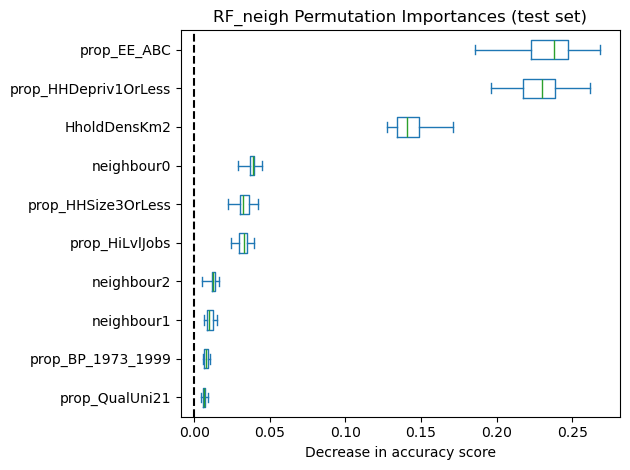

In [156]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

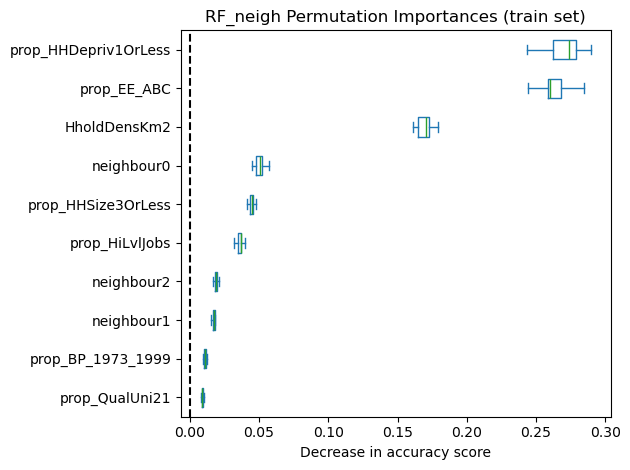

In [157]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

In [158]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


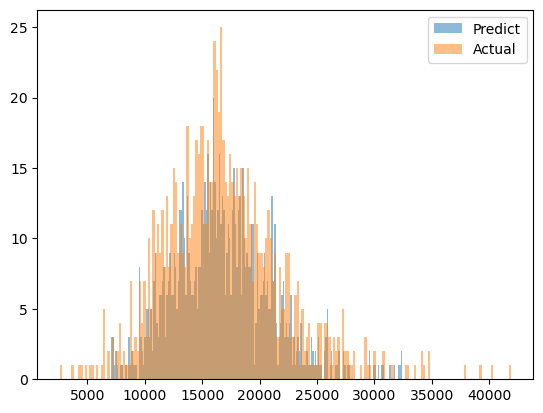

In [159]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [57]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [58]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:11.966506


In [59]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       34817312004.701
Log-likelihood:                                                  -35152.878
AIC:                                                              70321.756
AICc:                                                             70323.804
BIC:                                                           34817281468.132
R2:                                                                   0.666
Adj. R2:                                                              0.665

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [60]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

In [61]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [62]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.8210493743612096, MAE: 1573.0495706930237, RMSE: 2185.1477098907576


#### MGWR

In [166]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[3721. 3721. 1407.  502.   43.  218. 3721.  502.]
Code block run in 2:34:51.863850


In [167]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 0:55:46.545300


In [168]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       34817312004.701
Log-likelihood:                                                  -35152.878
AIC:                                                              70321.756
AICc:                                                             70323.804
BIC:                                                           34817281468.132
R2:                                                                   0.666
Adj. R2:                                                              0.665

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [169]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

In [170]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

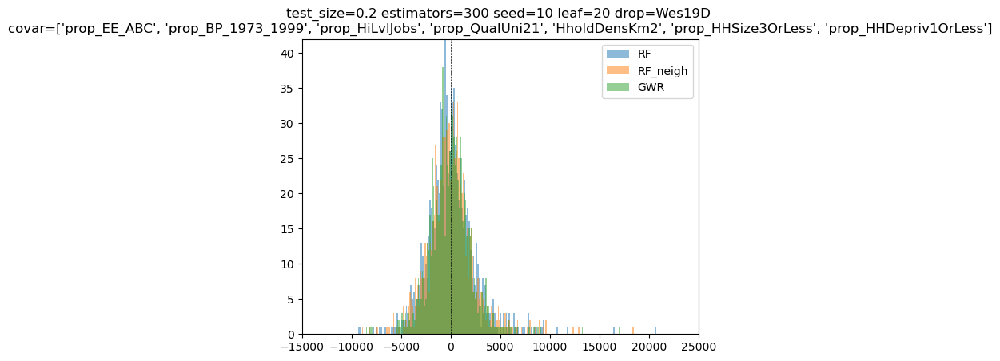

In [171]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/VarTest_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

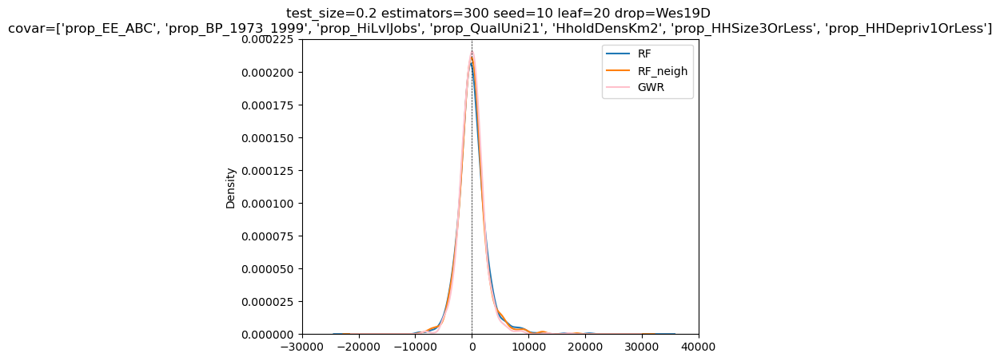

In [172]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/VarTest_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [173]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/VarTest_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,covar,drop,RF_R2_train,RF_R2_test,RF_R2,...,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE,MGWR_R2,MGWR_MAE,MGWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10 lea...,0.2,300,10,20,"['prop_EE_ABC', 'prop_BP_1973_1999', 'prop_HiL...",['Westminster 019D'],0.790187,0.751966,0.751966,...,NaN,NaN,NaN,NaN,0.844165,1492.602156,2039.14131,NaN,NaN,NaN


# Modelling 6 - testing var assemblage (4)

## Variables for all models - modify here for comparison runs

In [46]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '04' # assemblage number (for file names)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset04 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

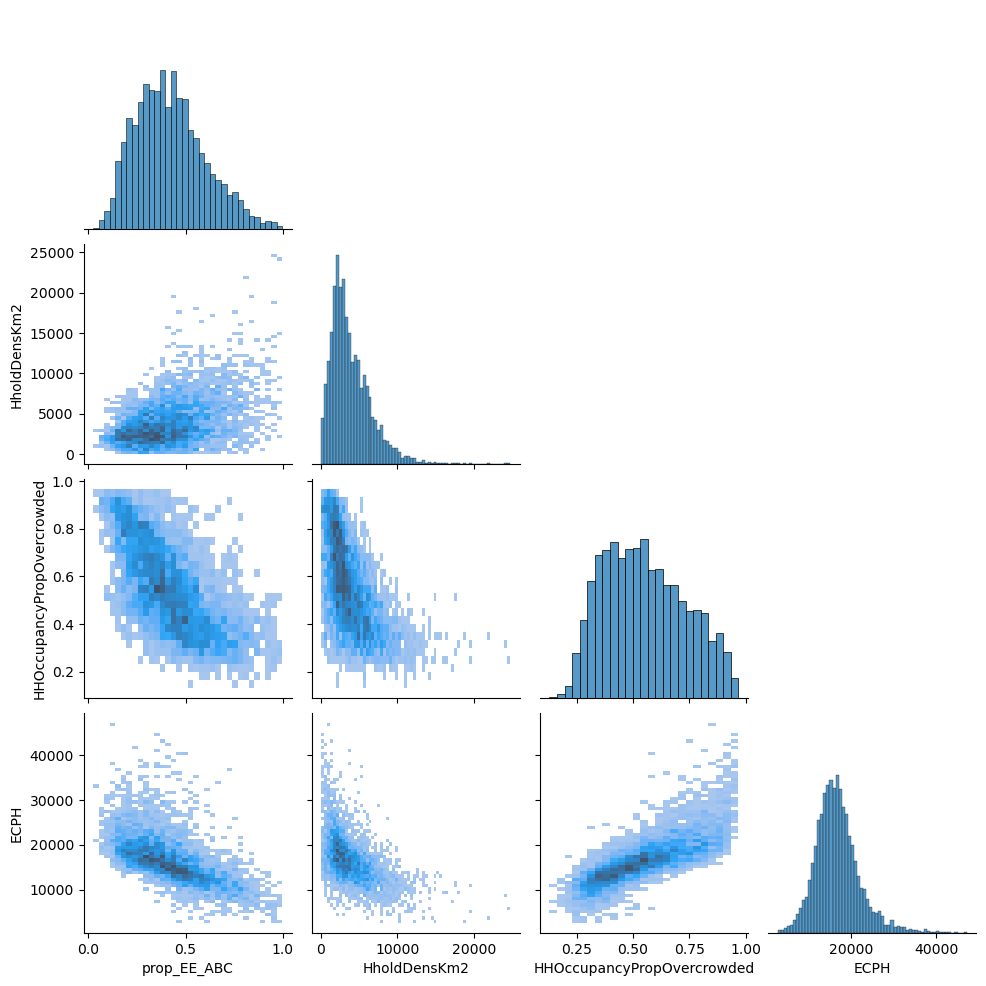

In [78]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)

In [79]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,HholdDensKm2,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,-0.544869,0.784131
prop_EE_ABC,-0.614302,1.000000,0.411579,-0.663737
HholdDensKm2,-0.544869,0.411579,1.000000,-0.590811
HHOccupancyPropOvercrowded,0.784131,-0.663737,-0.590811,1.000000


## Machine Learning

In [47]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

# Exporting dataset for easy retrieval
df_train.to_csv(f'output/varg{asnr}/varg{asnr}_dataset.csv')

### Random forest (without spatial factors)

In [81]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.73297
RF test R2: 0.68765
RF Model - R²: 0.6876477633839873, MAE: 2096.589031443295, RMSE: 2886.9316306966384


In [82]:
# Residuals
res_rf = y_test-y_pred

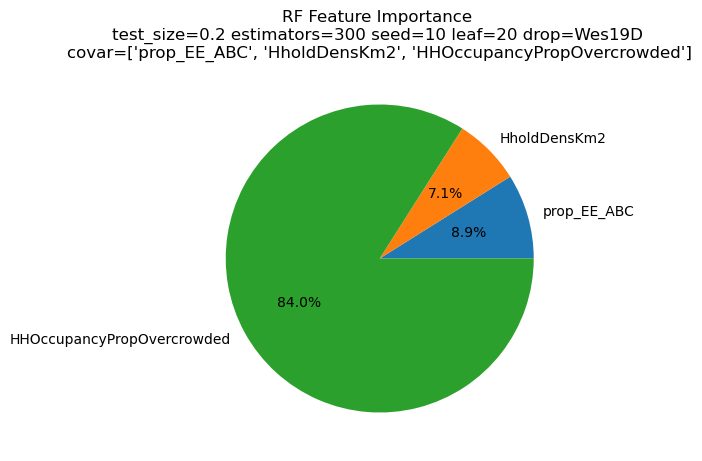

In [83]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

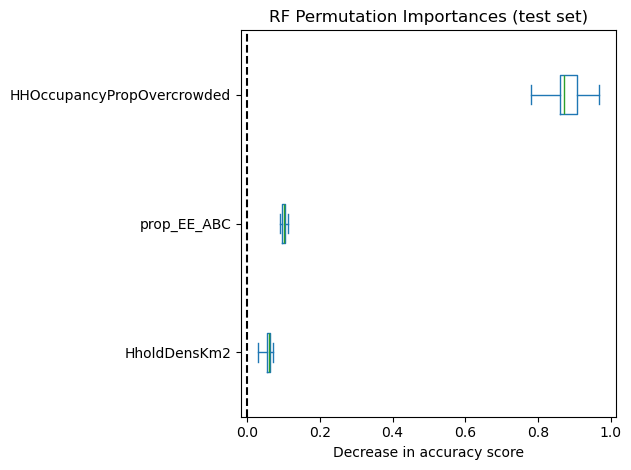

In [84]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

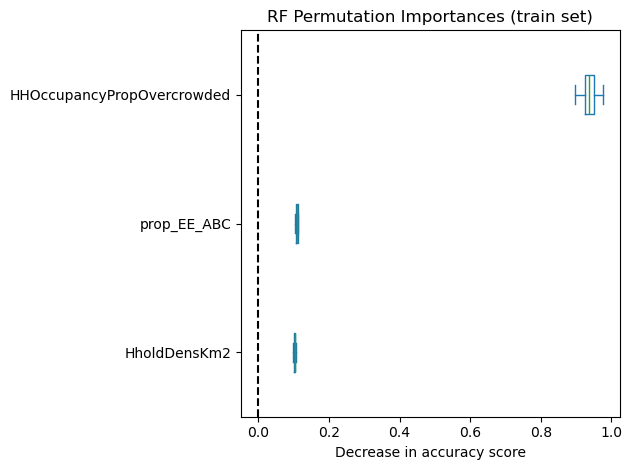

In [85]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

### RF with neighbour's y as parameter

In [86]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [87]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [88]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.78665
RF test R2: 0.74024
RF neighbours Model - R²: 0.7402384182314383, MAE: 1887.2957658196178, RMSE: 2632.7016701046596


In [89]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

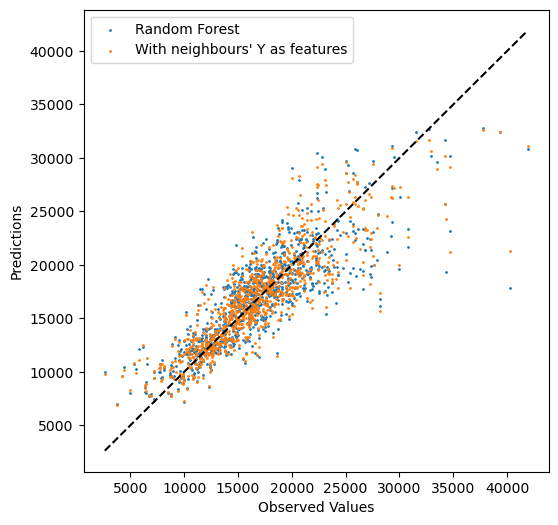

In [90]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

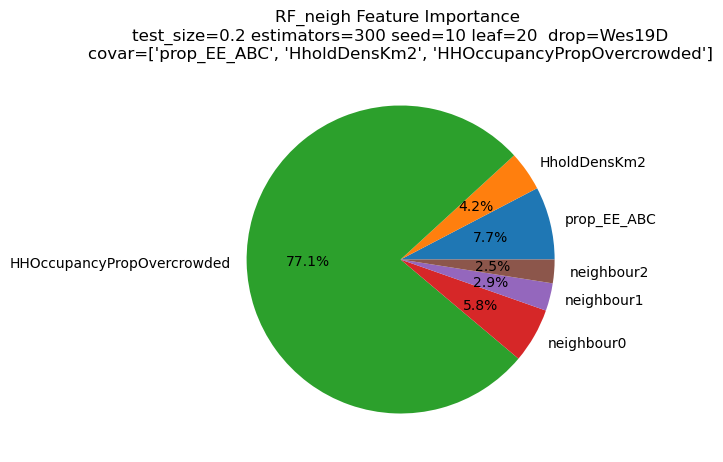

In [91]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

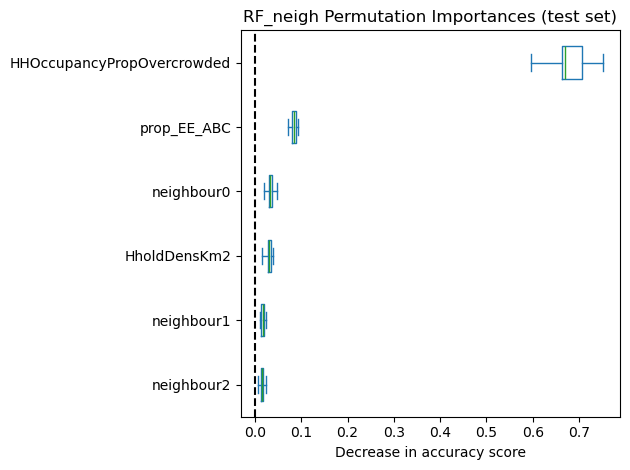

In [92]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

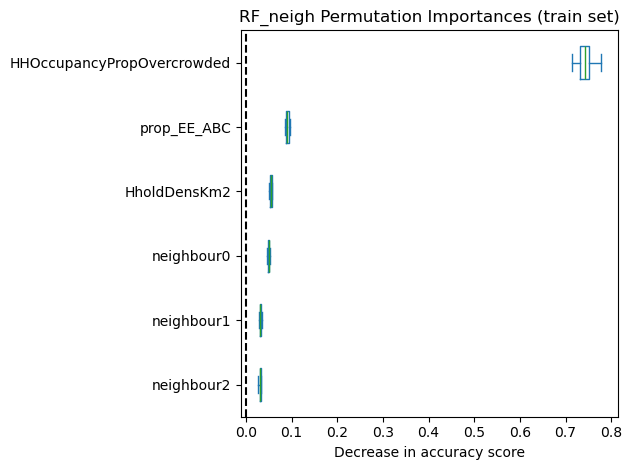

In [93]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

In [94]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


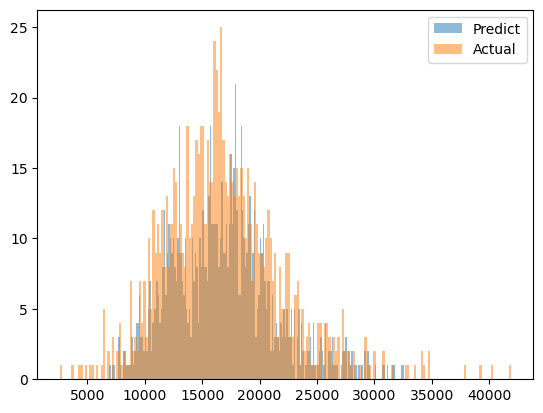

In [95]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [96]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [97]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:09.406589


In [98]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       37958696122.446
Log-likelihood:                                                  -35313.638
AIC:                                                              70635.277
AICc:                                                             70637.293
BIC:                                                           37958665552.989
R2:                                                                   0.636
Adj. R2:                                                              0.636

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [99]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

In [100]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [101]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.8304008665905852, MAE: 1547.8358875504534, RMSE: 2127.286594280504


#### MGWR

In [102]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[3721.  550.  218.   43.]
Code block run in 0:23:41.370980


In [103]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 0:06:28.113778


In [104]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       37958696122.446
Log-likelihood:                                                  -35313.638
AIC:                                                              70635.277
AICc:                                                             70637.293
BIC:                                                           37958665552.989
R2:                                                                   0.636
Adj. R2:                                                              0.636

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [105]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

In [106]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

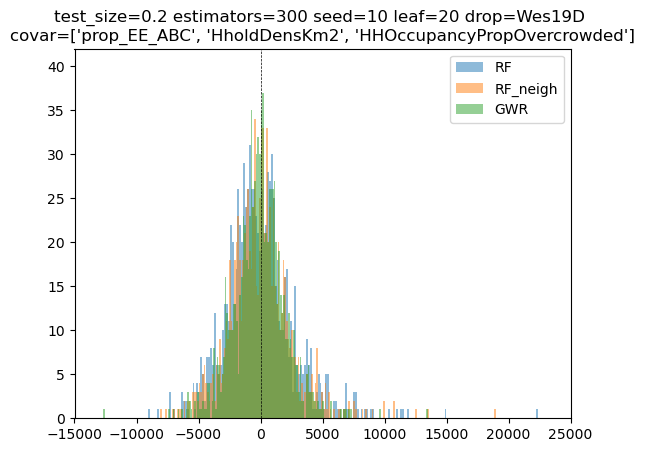

In [107]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/VarTest_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

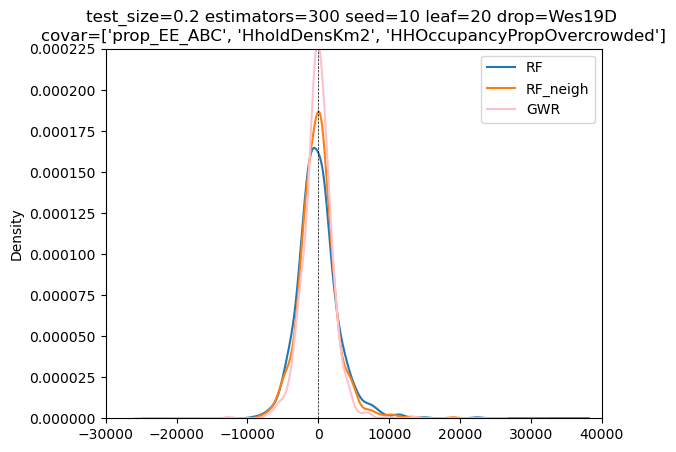

In [108]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/VarTest_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [109]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/VarTest_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,covar,drop,RF_R2_train,RF_R2_test,RF_R2,...,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE,MGWR_R2,MGWR_MAE,MGWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10 lea...,0.2,300,10,20,"['prop_EE_ABC', 'HholdDensKm2', 'HHOccupancyPr...",['Westminster 019D'],0.732968,0.687648,0.687648,...,NaN,NaN,NaN,NaN,0.830401,1547.835888,2127.286594,NaN,NaN,NaN


# Modelling 7 - testing var assemblage (5)

## Variables for all models - modify here for comparison runs

In [110]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '05' # assemblage number (for file names)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset05 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

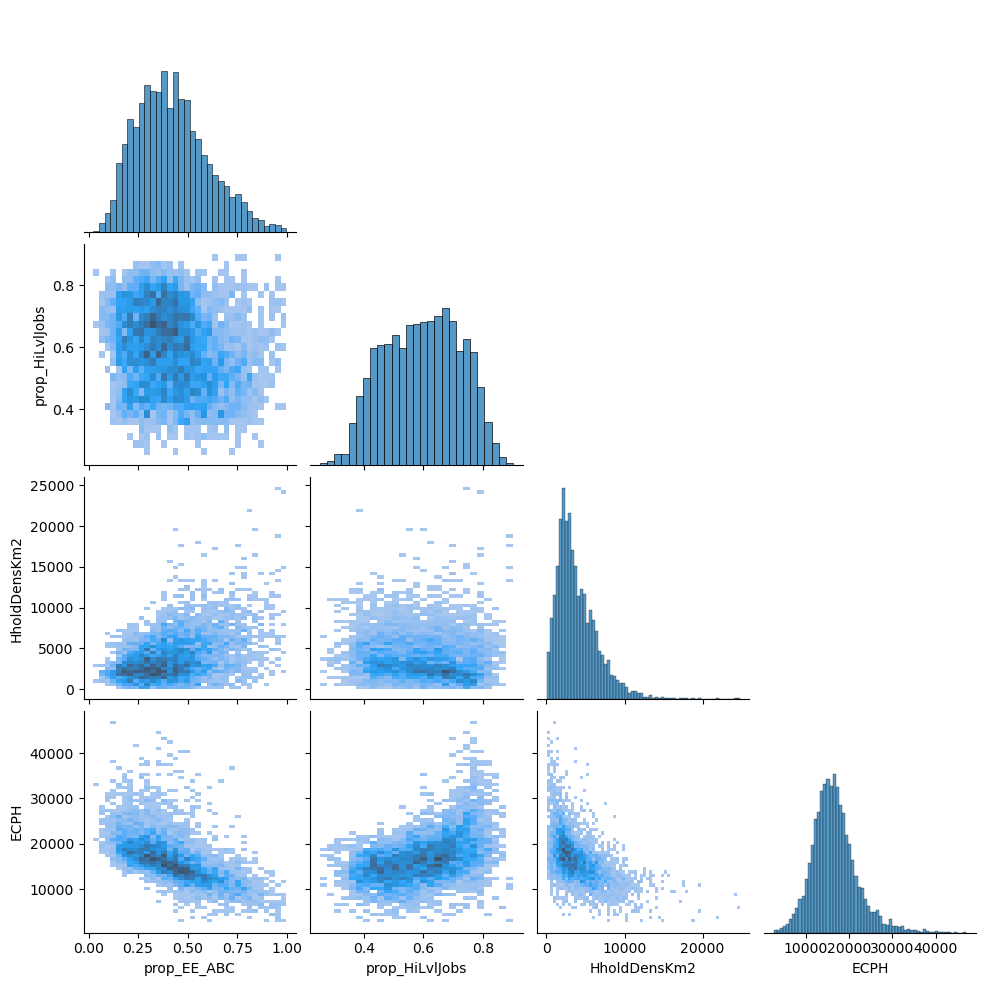

In [111]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)

In [112]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,prop_HiLvlJobs,HholdDensKm2
ECPH,1.000000,-0.614302,0.459623,-0.544869
prop_EE_ABC,-0.614302,1.000000,-0.203244,0.411579
prop_HiLvlJobs,0.459623,-0.203244,1.000000,-0.099549
HholdDensKm2,-0.544869,0.411579,-0.099549,1.000000


## Machine Learning

In [113]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [114]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.71025
RF test R2: 0.69003
RF Model - R²: 0.690032564291977, MAE: 2040.1933298848337, RMSE: 2875.889691490528


In [115]:
# Residuals
res_rf = y_test-y_pred

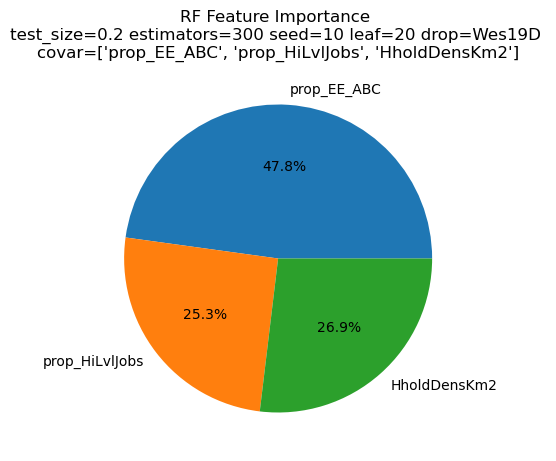

In [116]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

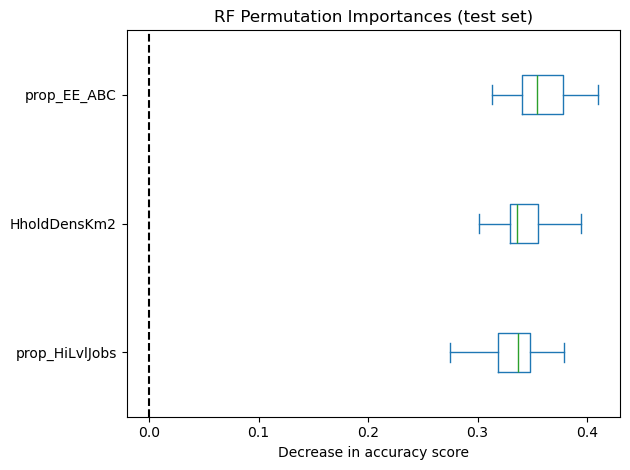

In [117]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

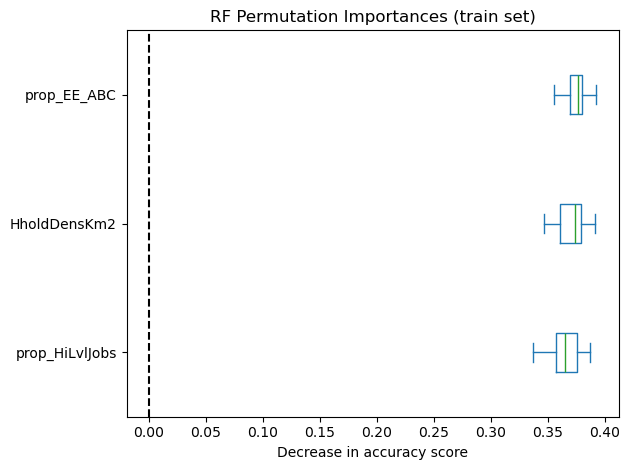

In [118]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RF_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

### RF with neighbour's y as parameter

In [119]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [120]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [121]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.75957
RF test R2: 0.72962
RF neighbours Model - R²: 0.7296186342176807, MAE: 1889.470844482738, RMSE: 2685.9787199545253


In [122]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

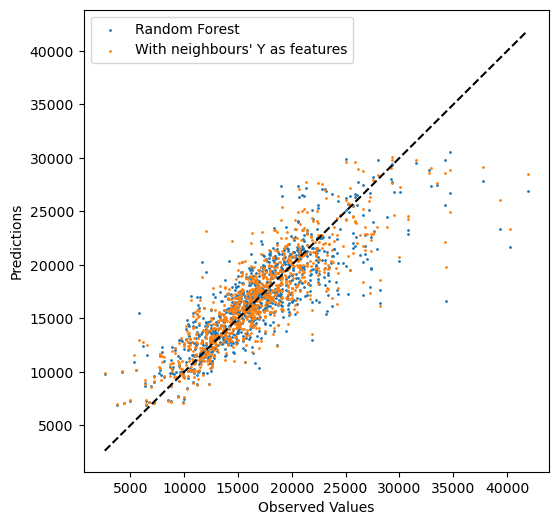

In [123]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

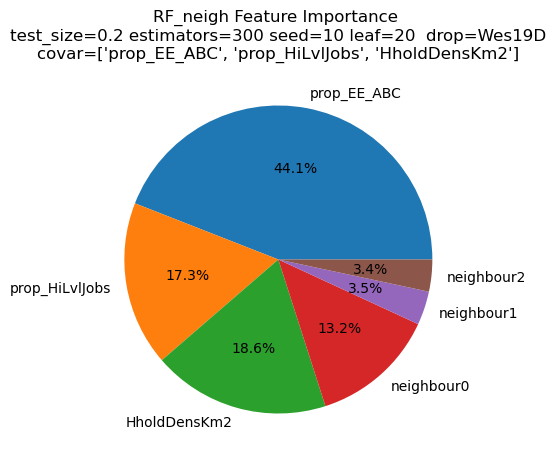

In [124]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/VarTest_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

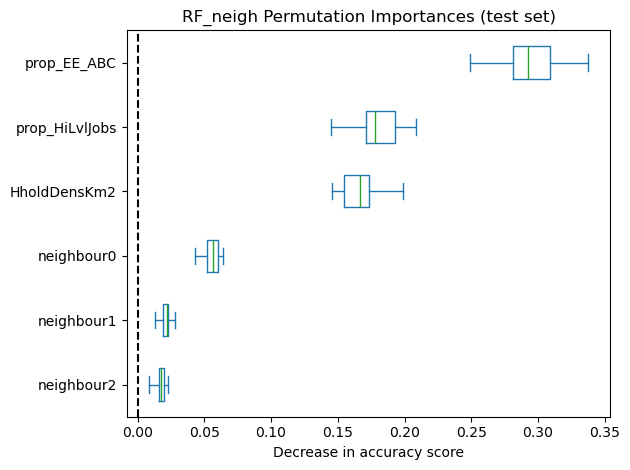

In [125]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

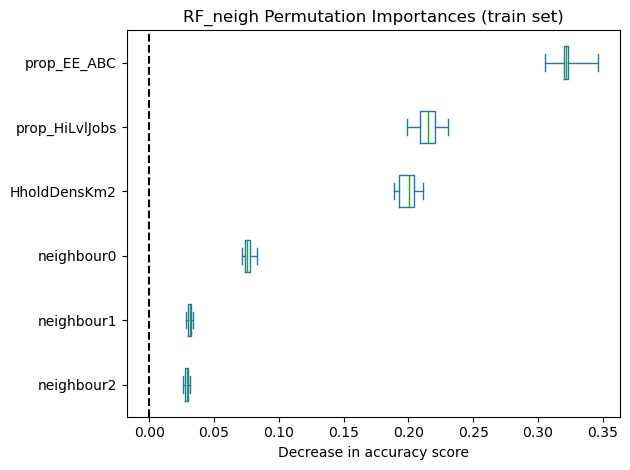

In [126]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/VarTest_RFn_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

In [127]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


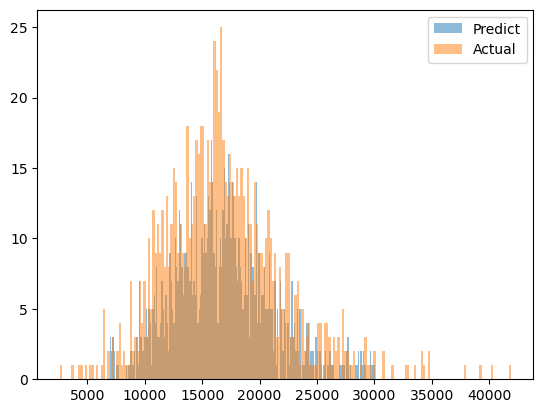

In [128]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [129]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [130]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:16.858155


In [131]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       43083297877.583
Log-likelihood:                                                  -35549.309
AIC:                                                              71106.619
AICc:                                                             71108.635
BIC:                                                           43083267308.126
R2:                                                                   0.587
Adj. R2:                                                              0.586

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [132]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

In [133]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [134]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.7919950084421671, MAE: 1744.2731456488334, RMSE: 2355.868619467078


#### MGWR

In [135]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[3721. 3721.   43.  218.]
Code block run in 0:31:05.356291


In [136]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 0:17:49.856775


In [137]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       43083297877.583
Log-likelihood:                                                  -35549.309
AIC:                                                              71106.619
AICc:                                                             71108.635
BIC:                                                           43083267308.126
R2:                                                                   0.587
Adj. R2:                                                              0.586

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [138]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

In [139]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

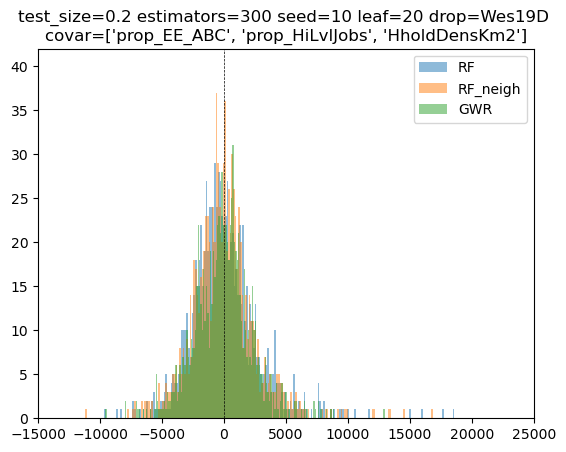

In [140]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/VarTest_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

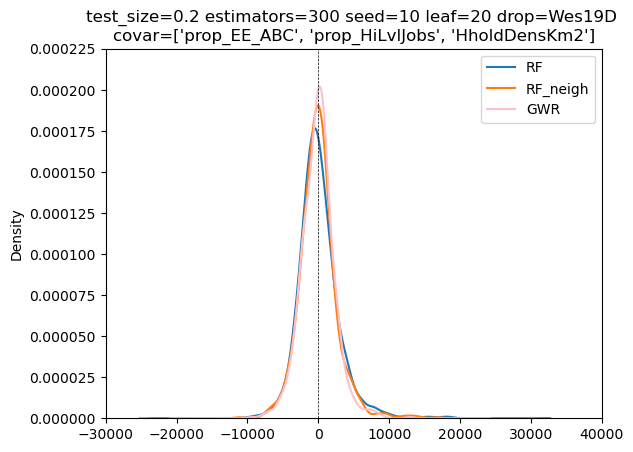

In [141]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/VarTest_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [142]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/VarTest_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,covar,drop,RF_R2_train,RF_R2_test,RF_R2,...,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE,MGWR_R2,MGWR_MAE,MGWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10 lea...,0.2,300,10,20,"['prop_EE_ABC', 'prop_HiLvlJobs', 'HholdDensKm2']",['Westminster 019D'],0.710253,0.690033,0.690033,...,NaN,NaN,NaN,NaN,0.791995,1744.273146,2355.868619,NaN,NaN,NaN


# Modelling 8 - testing var assemblage (6)

## Variables for all models - modify here for comparison runs

In [69]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '06' # assemblage number (for file names)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset06 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.2
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

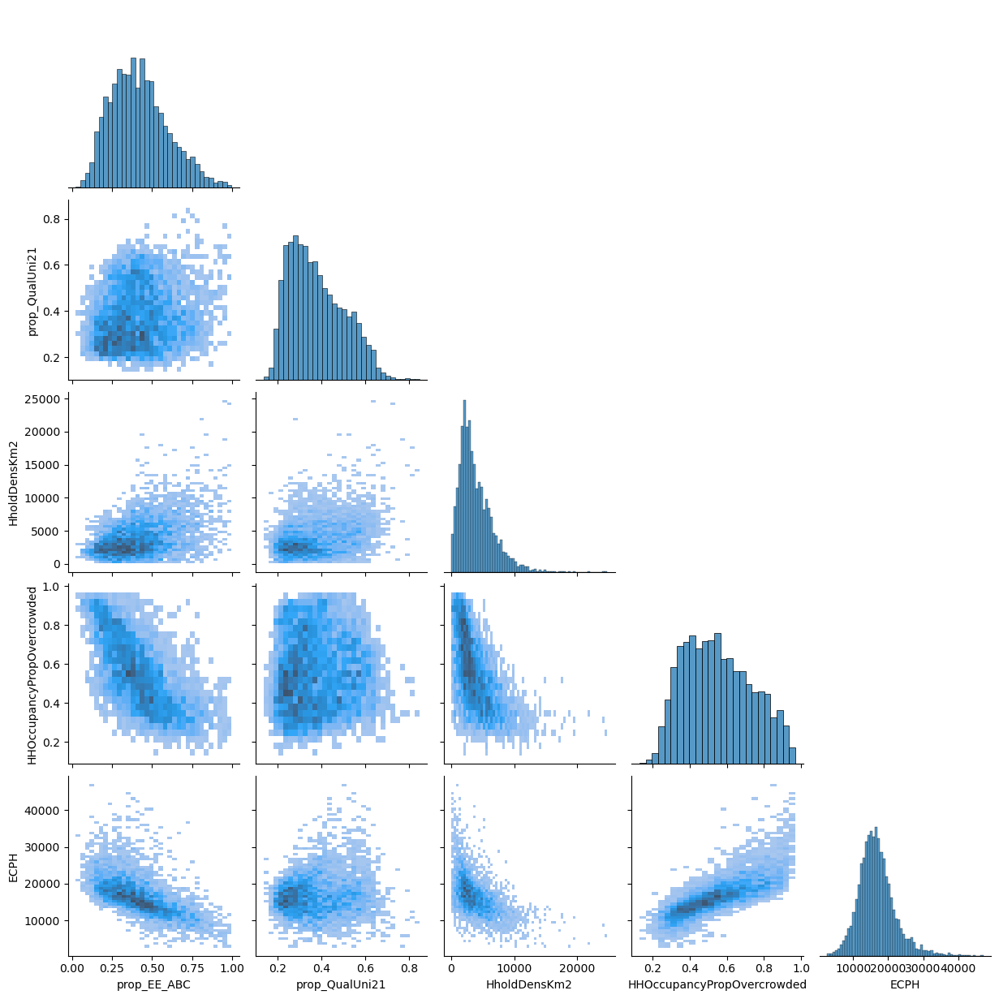

In [109]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)
plt.show()

In [71]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,prop_QualUni21,HholdDensKm2,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,0.101199,-0.544869,0.784131
prop_EE_ABC,-0.614302,1.000000,0.162157,0.411579,-0.663737
prop_QualUni21,0.101199,0.162157,1.000000,0.320164,0.022307
HholdDensKm2,-0.544869,0.411579,0.320164,1.000000,-0.590811
HHOccupancyPropOvercrowded,0.784131,-0.663737,0.022307,-0.590811,1.000000


## Machine Learning

In [72]:
# Split data into training & testing sets
df_train, df_test = train_test_split(dataset, test_size = test_prop, random_state = seed)

X = dataset[covar]
y = dataset[y_var]

X_train = df_train[covar]
X_test = df_test[covar]
y_train = df_train[y_var]
y_test = df_test[y_var]

### Random forest (without spatial factors)

In [73]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Model metrics
rf_R2_train = rf.score(X_train, y_train)
rf_R2_test = rf.score(X_test, y_test)
print(f"RF train R2: {rf_R2_train:.5f}")
print(f"RF test R2: {rf_R2_test:.5f}") #checking for overfitting
rf_r2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RF Model - R²: {rf_r2}, MAE: {rf_mae}, RMSE: {rf_rmse}")


RF train R2: 0.79829
RF test R2: 0.75445
RF Model - R²: 0.7544478796394058, MAE: 1835.969701704741, RMSE: 2559.6821103990656


In [74]:
# Residuals
res_rf = y_test-y_pred

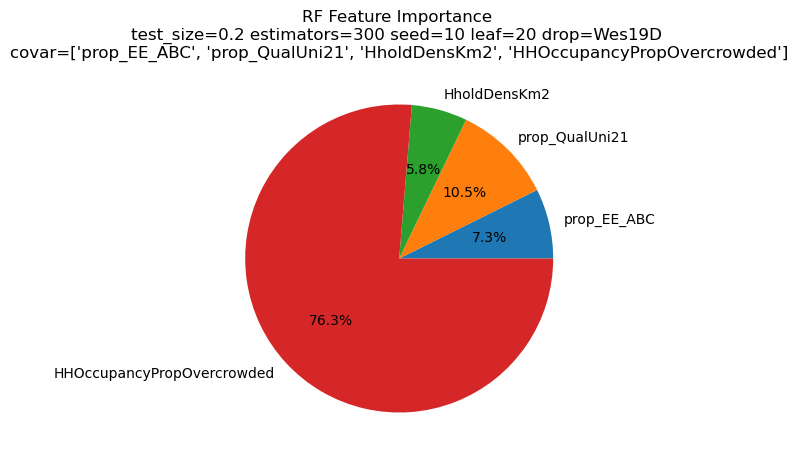

In [110]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X_train.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/Var{asnr}_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

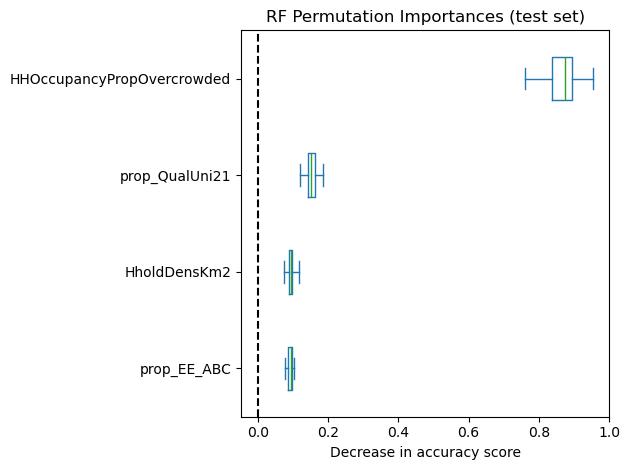

In [106]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X_test, y_test, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/Var{asnr}_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

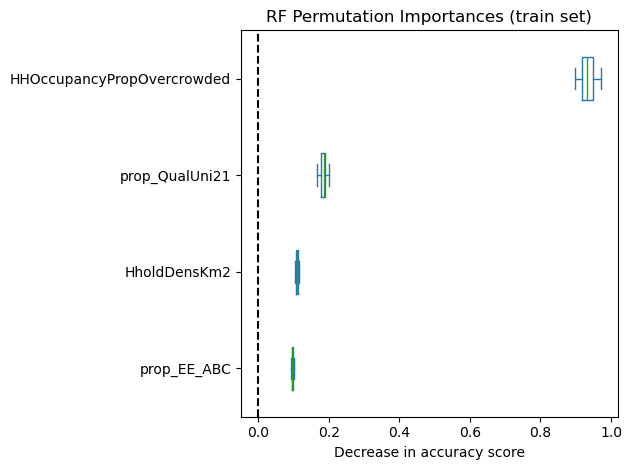

In [107]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf, X_train, y_train, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/Var{asnr}_RF_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

### RF with neighbour's y as parameter

In [78]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [79]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

X_train_neigh = X_neigh.loc[X_train.index] # Reuses the index of X_train from the general RF model
y_train_neigh = y_neigh.loc[X_train.index]

X_test_neigh = X_neigh.loc[X_test.index]
y_test_neigh = y_neigh.loc[X_test.index]

In [80]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_train_neigh, y_train_neigh)
y_pred_neigh = rf_neigh.predict(X_test_neigh)

# Model metrics
rf_neigh_R2_train = rf_neigh.score(X_train_neigh, y_train_neigh)
rf_neigh_R2_test = rf_neigh.score(X_test_neigh, y_test_neigh)
print(f"RF train R2: {rf_neigh_R2_train:.5f}")
print(f"RF test R2: {rf_neigh_R2_test:.5f}") #checking for overfitting
rf_neigh_r2 = r2_score(y_test_neigh, y_pred_neigh)
rf_neigh_mae = mean_absolute_error(y_test_neigh, y_pred_neigh)
rf_neigh_rmse = np.sqrt(mean_squared_error(y_test_neigh, y_pred_neigh))

print(f"RF neighbours Model - R²: {rf_neigh_r2}, MAE: {rf_neigh_mae}, RMSE: {rf_neigh_rmse}")

RF train R2: 0.82404
RF test R2: 0.78151
RF neighbours Model - R²: 0.7815112852866163, MAE: 1725.0470106186724, RMSE: 2414.5082507773923


In [81]:
# Residuals
res_rf_neigh = y_test_neigh-y_pred_neigh

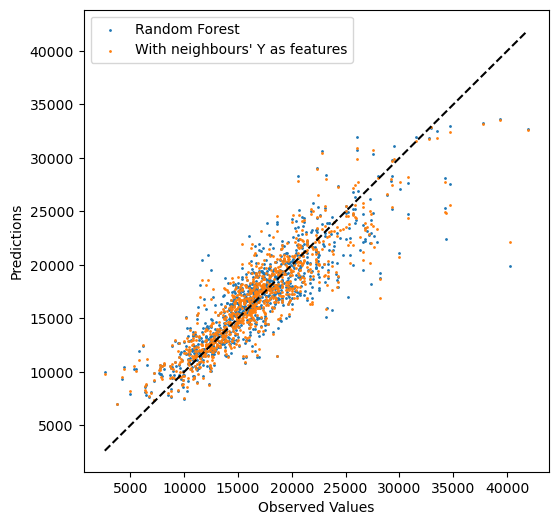

In [108]:
# Comparing the two RF models by plotting predict VS actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, s=1, label='Random Forest')
plt.scatter(y_test_neigh, y_pred_neigh, s=1, label="With neighbours' Y as features")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')
plt.xlabel('Observed Values')
plt.ylabel('Predictions')
plt.legend()
plt.show()

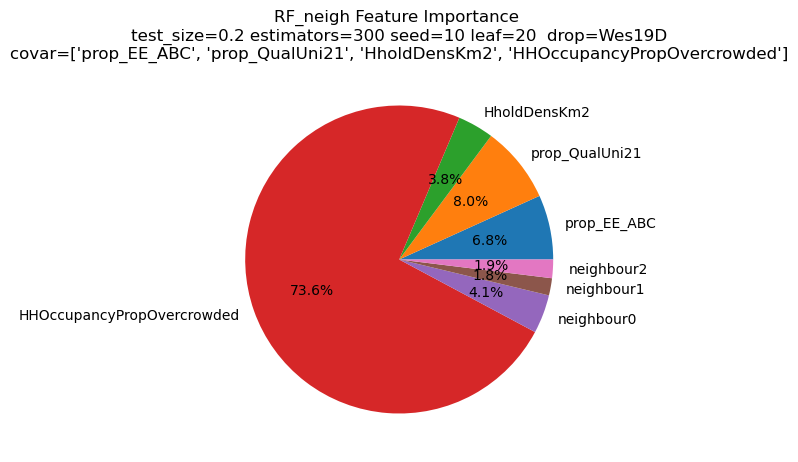

In [83]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_test_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/Var{asnr}_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

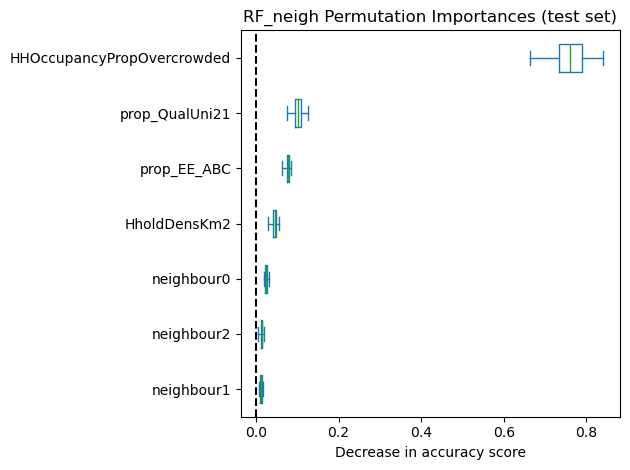

In [103]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_test_neigh, y_test_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (test set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/Var{asnr}_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

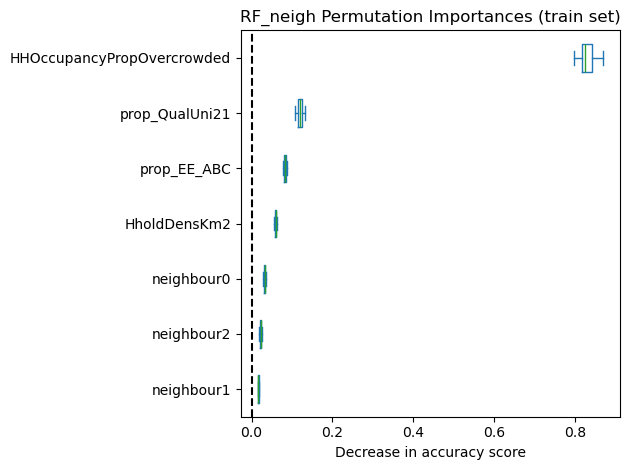

In [104]:
# Permutation Importance - Training Set
# when variables importance is inflated in training set VS test set, there is likely overfitting
result = permutation_importance(
    rf_neigh, X_train_neigh, y_train_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances (train set)")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/Var{asnr}_RFn_PermImpTra_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [86]:
print(len(y_pred_neigh), len(y_test_neigh)) # Just making sure everything is as it should

931 931


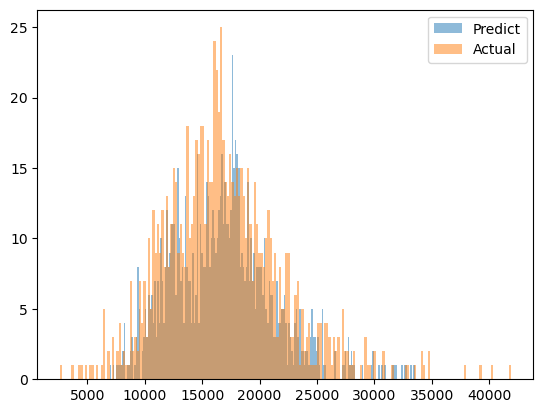

In [105]:
# Checking the distributions of actual VS predicted
plt.hist(y_pred_neigh, bins=200, alpha=0.5, label='Predict')
plt.hist(y_test_neigh, bins=200, alpha=0.5, label='Actual')
plt.legend()
plt.show()

## GWR & MGWR

#### GWR

In [88]:
# Prepare inputs
g_y_train = df_train[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_train = df_train[covar].values # Independent var

g_y_test = df_test[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X_test = df_test[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u_train = df_train['Longitude']
v_train = df_train['Latitude']
g_coords_train = np.array(list(zip(u_train,v_train)))

u_test = df_test['Longitude']
v_test = df_test['Latitude']
g_coords_test = np.array(list(zip(u_test,v_test)))

In [89]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords_train, 
                  g_y_train, # Independent variable
                  g_X_train, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords_train,
                         g_y_train,
                         g_X_train,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:22.132687


In [90]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       34786089347.452
Log-likelihood:                                                  -35151.208
AIC:                                                              70312.417
AICc:                                                             70314.439
BIC:                                                           34786058786.217
R2:                                                                   0.666
Adj. R2:                                                              0.666

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [91]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

In [92]:
# Getting GWR residuals  for predictions on test set (this code block doesn't like to be run twice)
y_pred_gwr = gwr_model.predict(g_coords_test, g_X_test).predictions
res_gwr = y_test - y_pred_gwr.flatten()

In [93]:
# Model metrics
gwr_r2 = r2_score(y_test, y_pred_gwr)
gwr_mae = mean_absolute_error(y_test, y_pred_gwr)
gwr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gwr))
print(f"MGWR Model - R²: {gwr_r2}, MAE: {gwr_mae}, RMSE: {gwr_rmse}")

MGWR Model - R²: 0.8362233229490907, MAE: 1515.9435665264766, RMSE: 2090.452079621419


#### MGWR

In [94]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords_train, g_y_train, g_X_train, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[3721.  752. 3721.  246.   43.]
Code block run in 0:40:00.237124


In [95]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords_train, g_y_train, g_X_train, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 0:15:42.811567


In [96]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                3722
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       34786089347.452
Log-likelihood:                                                  -35151.208
AIC:                                                              70312.417
AICc:                                                             70314.439
BIC:                                                           34786058786.217
R2:                                                                   0.666
Adj. R2:                                                              0.666

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [97]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

In [98]:
# Get model residuals for predictions on test set
#y_pred_mgwr = mgwr_model.predict(g_coords,g_X_test).predictions # MGWR predict() is not implemented!
#res_mgwr = y_test - y_pred_mgwr

## Models comparison

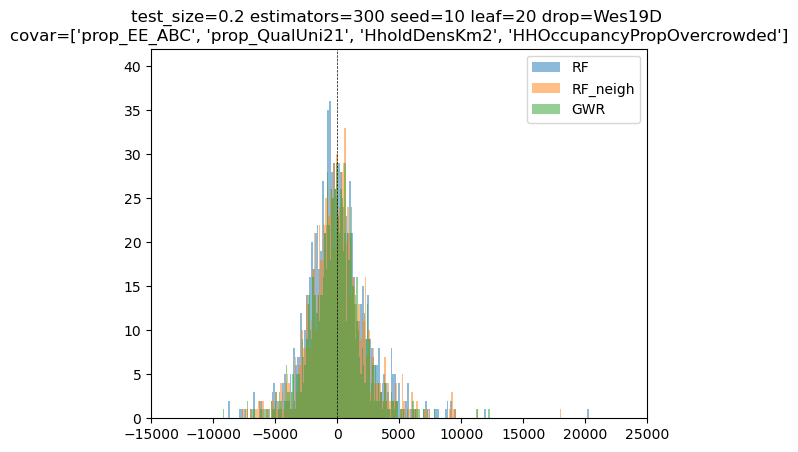

In [99]:
# Plotting residuals for comparison
fig, ax = plt.subplots()
if 'res_ols' in locals():
    plt.hist(res_ols, bins=200, alpha=0.5, label='OLS')
if 'res_rf' in locals():
    plt.hist(res_rf, bins=200, alpha=0.5, label='RF')
if 'res_rf_neigh' in locals():
    plt.hist(res_rf_neigh, bins=200, alpha=0.5, label='RF_neigh')
if 'res_rf_spatial' in locals():
    plt.hist(res_rf_spatial, bins=200, alpha=0.5, label='RF_spatial')
if 'res_rf_geo' in locals():
    plt.hist(res_rf_geo, bins=200, alpha=0.5, label='RF_geo')
if 'res_gwr' in locals():
    plt.hist(res_gwr, bins=200, alpha=0.5, label='GWR')
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.ylim(0,42)
plt.xlim(-15000,25000)
plt.legend()
plt.savefig(f'output/comp_hist/Var{asnr}_ModResCompHist_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

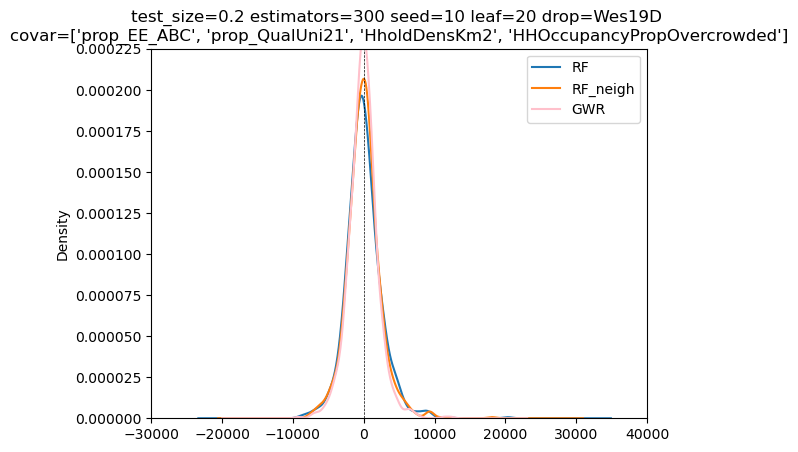

In [100]:
# kde of the residuals
fig, ax = plt.subplots(1)
if 'res_ols' in locals():
    res_ols.plot.kde(label='OLS')
if 'res_rf' in locals():
    res_rf.plot.kde(label='RF')
if 'res_rf_neigh' in locals():
    res_rf_neigh.plot.kde(label='RF_neigh')
if 'res_rf_spatial' in locals():
    res_rf_spatial.plot.kde(label='RF_spatial')
if 'res_rf_geo' in locals():
    res_rf_geo.plot.kde(label='RF_geo')
if 'res_gwr' in locals():
    res_gwr.plot.kde(label='GWR', color='pink')
plt.ylim(0,0.000225)
plt.xlim(-30000,40000)
plt.title(f'test_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')
plt.axvline(x=0, color='black', linestyle='--', linewidth=.5)
plt.legend()
plt.savefig(f'output/comp_KDE/Var{asnr}_ModResCompKDE_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

In [101]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['varset'] = asnr
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_r2' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_r2' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_r2' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_r2' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_r2' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_r2' in locals() else np.nan

metrics_df.to_csv(f'output/Var{asnr}_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,varset,covar,drop,RF_R2_train,RF_R2_test,...,RF_SPATIAL_RMSE,RF_GEO_R2,RF_GEO_MAE,RF_GEO_RMSE,GWR_R2,GWR_MAE,GWR_RMSE,MGWR_R2,MGWR_MAE,MGWR_RMSE
0,test prop = 0.2 estimators = 300 seed = 10 lea...,0.2,300,10,20,06,"['prop_EE_ABC', 'prop_QualUni21', 'HholdDensKm...",['Westminster 019D'],0.798294,0.754448,...,NaN,NaN,NaN,NaN,0.836223,1515.943567,2090.45208,NaN,NaN,NaN


# **SECTION 3**: MGWR & GWR re-runs with full dataset (not just train set)

# Modelling 9 - var assemblage (4), full dataset (no train test split)

## Variables for all models - modify here for comparison runs

In [49]:
# Parameters selected
# this is used as a central point to assign key variables for all RF models when doing multiple test runs to find optimal parameters or test variables
asnr = '04f' # assemblage number (for file names) - "f" for "full dataset" (bar outliers)
drop_nm = ['Westminster 019D']
dataset = short_df.drop(index=short_df.loc[short_df['AREA_NAME']==drop_nm[0]].index).reset_index() # dataset used -- dropped Westminster 019D as it was a big outlier + had to reset index as it was causing issues further down
covar = varset04 # independent variables
y_var = 'ECPH' #dependent variable
n_est = 300 # number of estimators for RF models. 300 was found better.
test_prop = 0.0
seed = 10
leaf = 20 # Min sample leaf, to prevent overfitting. = minimum nr of samples in a branch
nr_neigh = 3 # Number of neighbours for RF regressor with neighbour's Y as a parameter

# Saving a short covar name for manageable filenames
covar_short = ""
for i in covar:
    covar_short += i[:2] + i[-2:]
drop_short = ""
for i in drop_nm:
    drop_short += i[:3] + i[-3:]

# Exporting dataset for easy retrieval
dataset.to_csv(f'output/varg{asnr}/varg{asnr}_dataset.csv')

# Storage for variables lists
# Original list from CW1 : ['EE_ABC', 'prop_BP_1973_1999', 'prop_BP_2000_2009', 'prop_HiLvlJobs'] 

## Variables EDA   
Checking correlations and outliers after having explored important variables for RF

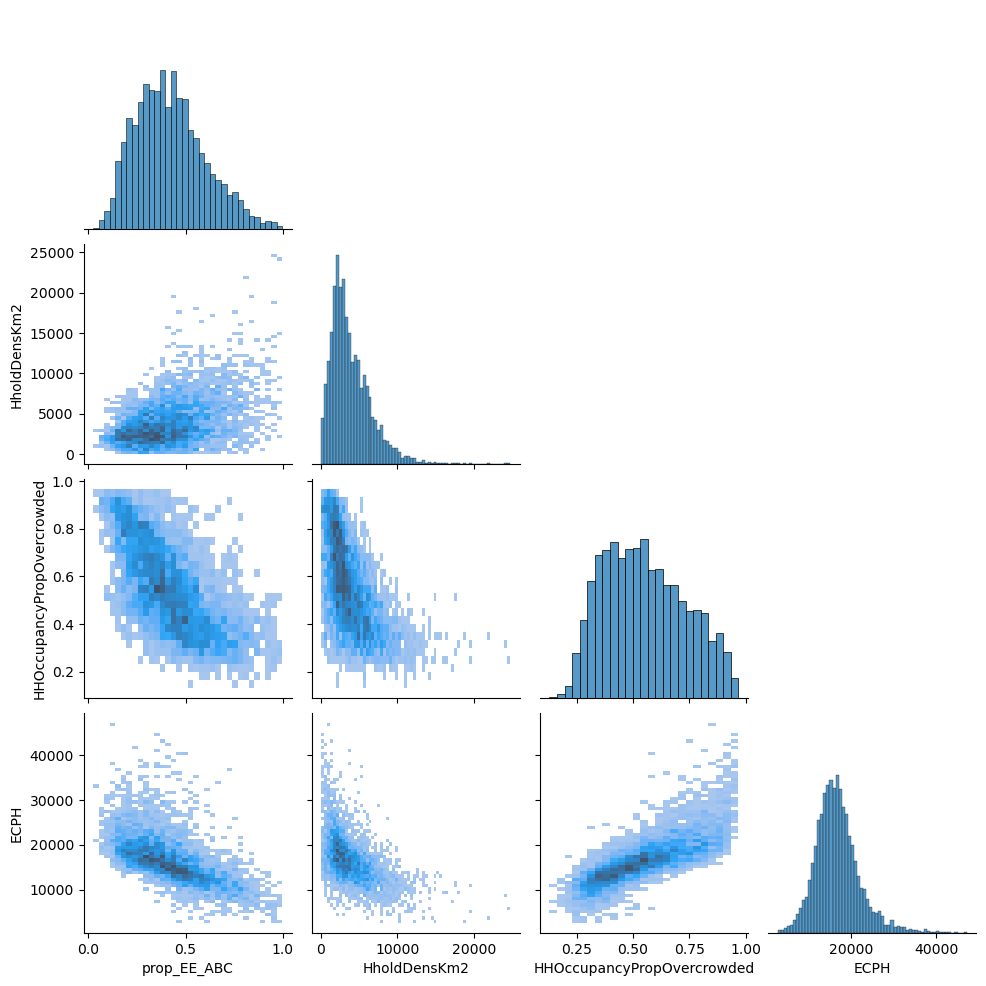

In [20]:
sb.pairplot(dataset[covar+[y_var]],kind='hist', corner=True)
plt.show()

In [21]:
dataset[[y_var]+covar].corr()

,ECPH,prop_EE_ABC,HholdDensKm2,HHOccupancyPropOvercrowded
ECPH,1.000000,-0.614302,-0.544869,0.784131
prop_EE_ABC,-0.614302,1.000000,0.411579,-0.663737
HholdDensKm2,-0.544869,0.411579,1.000000,-0.590811
HHOccupancyPropOvercrowded,0.784131,-0.663737,-0.590811,1.000000


## Machine Learning

In [22]:
# Split data into training & testing sets
X = dataset[covar]
y = dataset[y_var]

### Random forest (without spatial factors)

In [23]:
# Initialize and fit RF
rf = RandomForestRegressor(n_estimators = n_est, min_samples_leaf=leaf)
rf.fit(X, y)

# Model metrics
rf_R2 = rf.score(X, y)
print(f"RF R2: {rf_R2:.5f}")

RF R2: 0.73652


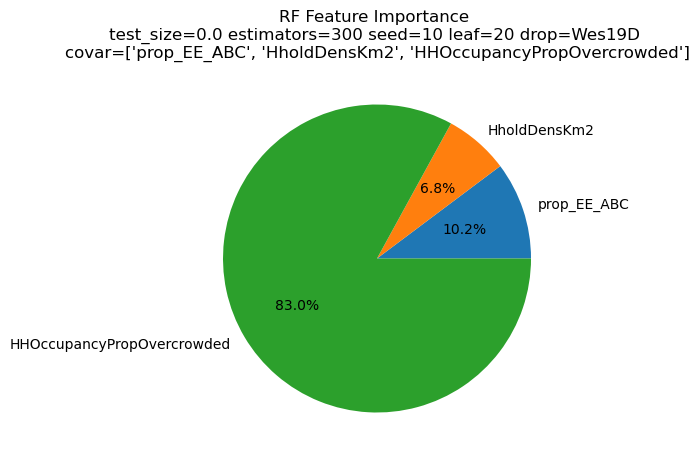

In [24]:
# using pie chart to show the feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf.feature_importances_, labels=X.columns, autopct='%1.1f%%')
plt.title(f'RF Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf} drop={drop_short} \ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/Var{asnr}_RF_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

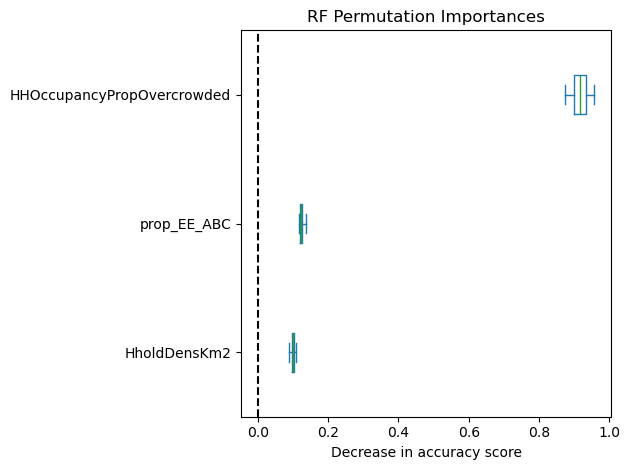

In [25]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf, X, y, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF Permutation Importances")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/Var{asnr}_RF_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

### RF with neighbour's y as parameter

In [26]:
coord = dataset[['Latitude', 'Longitude']]
N_NEIGHBOURS = nr_neigh # Define number of neighbours to use
dist = scipy.spatial.distance.cdist(coord, coord, 'euclidean') # calculate the distance matrix
# create a dictionary to store the neighbours
neighbours_dict = {}
for i in range(len(dist)):
    neighbours_dict[i] = np.argsort(dist[i])[1:N_NEIGHBOURS + 1]
# incoporate neighbours' Y as features
dataset_neigh = dataset.copy()
for i in range(N_NEIGHBOURS):
    dataset_neigh['neighbour' + str(i)] = dataset_neigh.index.map(lambda x: dataset_neigh.loc[neighbours_dict[x][i], y_var])
    if i==0:
        neigh_cols = ['neighbour' + str(i)]
    else:
        neigh_cols.append('neighbour' + str(i))

In [27]:
# prepare training & testing sets
X_neigh = dataset_neigh[covar + neigh_cols]
y_neigh = dataset_neigh[y_var]

In [28]:
# RF with neighbours' Y as features
rf_neigh = RandomForestRegressor(n_estimators = n_est, n_jobs=-1, min_samples_leaf=leaf)
rf_neigh.fit(X_neigh, y_neigh)

# Model metrics
rf_neigh_R2 = rf_neigh.score(X_neigh, y_neigh)
print(f"RF R2: {rf_neigh_R2:.5f}")

RF R2: 0.79053


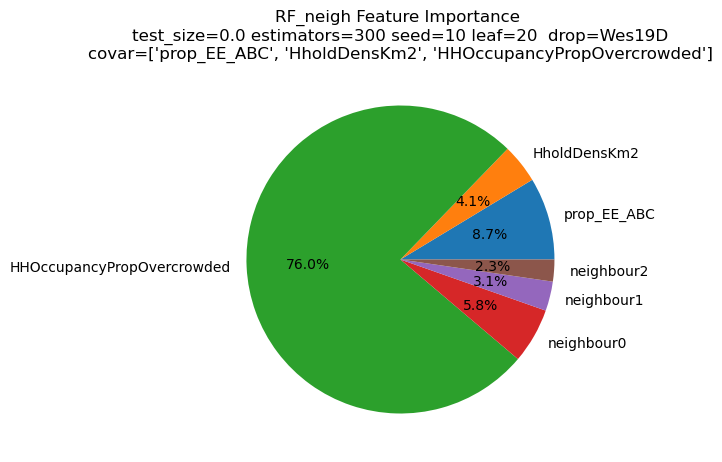

In [29]:
# Pie chart of feature importance
plt.figure(figsize=(5, 5))
plt.pie(rf_neigh.feature_importances_, labels=X_neigh.columns, autopct='%1.1f%%')
plt.title(f'RF_neigh Feature Importance \ntest_size={test_prop} estimators={n_est} seed={seed} leaf={leaf}  drop={drop_short}\ncovar={covar}')

plt.savefig(f'output/comp_FeatImp/Var{asnr}_RFn_FeatImp_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')

plt.show()

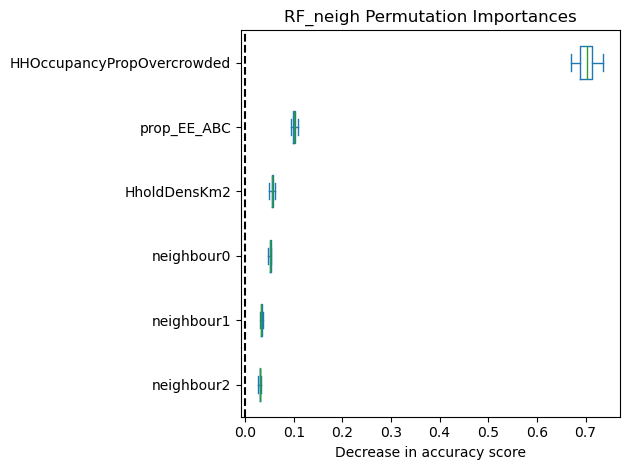

In [31]:
# Features importance: Permutation Importance (can work on prediction set unlike the default method of Mean Decrease in Impurity (MDI), helps check for overfitting)
# from: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
result = permutation_importance(
    rf_neigh, X_neigh, y_neigh, n_repeats=20, random_state=seed, n_jobs=-1
)

sorted_importances_idx = result.importances_mean.argsort()
importances = pd.DataFrame(
    result.importances[sorted_importances_idx].T,
    columns=X_neigh.columns[sorted_importances_idx],
)
ax = importances.plot.box(vert=False, whis=10)
ax.set_title("RF_neigh Permutation Importances")
ax.axvline(x=0, color="k", linestyle="--")
ax.set_xlabel("Decrease in accuracy score")
ax.figure.tight_layout()
plt.savefig(f'output/comp_PermImp/Var{asnr}_RFn_PermImpTst_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.png', dpi=300, bbox_inches='tight')
plt.show()

## GWR & MGWR

#### GWR

In [50]:
# Prepare inputs
g_y = dataset[y_var].values.reshape((-1,1)) # Dependent var # reshape array to horizontal
g_X = dataset[covar].values # Independent var

# Define long lat information
# nota: here I use reversed order for lat & long compared to Kai or Practical answer, but it kinda makes more sense that long is x and lat is y? Will see if it causes significant differences. TESTED: order makes no difference.
u = dataset['Longitude']
v = dataset['Latitude']
g_coords = np.array(list(zip(u,v)))

In [33]:
# Bandwidth selection
start = time.perf_counter() # Performance counter
gwr_bw = mgwr.sel_bw.Sel_BW(g_coords, 
                  g_y, # Independent variable
                  g_X, # Dependent variable
                  fixed=False, # True for fixed bandwidth and false for adaptive bandwidth
                  spherical=False) # Spherical or projected coord. Here we are in EPSG 27700 --> projected - weird that we say projected when using long-lat, but that's the way it is in practical. TESTED: it appears to make no difference
gwr_bw.search() # Search optimal bw
# Build GWR
gwr_model = mgwr.gwr.GWR(g_coords,
                         g_y,
                         g_X,
                         gwr_bw.bw[0]) 
gwr_results = gwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
gwr_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {gwr_elapsed_time_str}')

Code block run in 0:00:22.252488


In [34]:
# Show results
gwr_results.summary()

#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/GWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        gwr_results.summary()
with open(f'output/GWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nGWR run in {gwr_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                4653
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       46475057473.844
Log-likelihood:                                                  -44098.322
AIC:                                                              88204.644
AICc:                                                             88206.656
BIC:                                                           46475018211.796
R2:                                                                   0.640
Adj. R2:                                                              0.640

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [36]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_params.npy', gwr_results.params)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_filter_tvals.npy', gwr_results.filter_tvals())
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_resid_response.npy', gwr_results.resid_response)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_predy.npy', gwr_results.predy)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_W.npy', gwr_results.W)
np.save(f'output/varg{asnr}/GWR_bw{gwr_bw.bw[0]:.0f}_{covar_short}_drop{drop_short}_localR2.npy', gwr_results.localR2)

#### MGWR

In [51]:
start = time.perf_counter() # Performance counter
# Bandwidth selection
mgwr_selector = Sel_BW(g_coords, g_y, g_X, multi=True)
mgwr_bw = mgwr_selector.search() # Search for optimum bw
print(mgwr_bw)

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_bw_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_bw_elapsed_time_str}')

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[  47. 4652.  837.   43.]
Code block run in 0:26:22.952309


In [52]:
start = time.perf_counter() # Performance counter
# Build MGWR
mgwr_model = mgwr.gwr.MGWR(g_coords, g_y, g_X, mgwr_selector)
mgwr_results = mgwr_model.fit()

# Performance check
end = time.perf_counter()
elapsed_time = end - start
mgwr_fit_elapsed_time_str = str(timedelta(seconds=elapsed_time)) # Convert the elapsed time to a timedelta object 
print(f'Code block run in {mgwr_fit_elapsed_time_str}')

Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Code block run in 0:15:24.825868


In [53]:
# Summary
mgwr_results.summary()
#Save summary to file
# code from https://stackoverflow.com/questions/45199047/how-to-save-model-summary-to-file-in-keras
with open(f'output/MGWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'w') as f:
    with redirect_stdout(f):
        mgwr_results.summary()
with open(f'output/MGWR_summary_Var{asnr}_{covar_short}_drop{drop_short}.txt', 'a') as f:
    f.write(f'\nMGWR bw found in {mgwr_bw_elapsed_time_str}\nMGWR fitted in {mgwr_fit_elapsed_time_str} \nVariables: {str(covar)}')

Model type                                                         Gaussian
Number of observations:                                                4653
Number of covariates:                                                     4

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       46475057473.844
Log-likelihood:                                                  -44098.322
AIC:                                                              88204.644
AICc:                                                             88206.656
BIC:                                                           46475018211.796
R2:                                                                   0.640
Adj. R2:                                                              0.640

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- 

In [54]:
# Saving arrays to file so that I don't have to re-run the models (which takes half a day for the MGWR)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_params.npy', mgwr_results.params)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_filter_tvals.npy', mgwr_results.filter_tvals())
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_resid_response.npy', mgwr_results.resid_response)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_predy.npy', mgwr_results.predy)
np.save(f'output/varg{asnr}/MGWR_{covar_short}_drop{drop_short}_W.npy', mgwr_results.W)

## Models comparison

In [57]:
# Gathering model metrics
# Getting all into a dataframe
metrics_df = pd.DataFrame() # new dataframe
metrics_df['model_params'] = [f'test prop = {test_prop} estimators = {n_est} seed = {seed} leaf min = {leaf} covariates = {covar} drop = {drop_nm}']
metrics_df['test_prop'] = test_prop
metrics_df['estimators'] = n_est
metrics_df['seed'] = seed
metrics_df['leaf_min'] = leaf
metrics_df['varset'] = asnr
metrics_df['covar'] = str(covar)
metrics_df['drop'] = str(drop_nm)
metrics_df['RF_R2_train'] = rf_R2_train if 'rf_R2_train' in locals() else np.nan
metrics_df['RF_R2_test'] = rf_R2_test if 'rf_R2_test' in locals() else np.nan
metrics_df['RF_R2'] = rf_r2 if 'rf_r2' in locals() else np.nan
metrics_df['RF_MAE'] = rf_mae if 'rf_mae' in locals() else np.nan
metrics_df['RF_RMSE'] = rf_rmse if 'rf_rmse' in locals() else np.nan
metrics_df['RF_NEIGH_R2_train'] = rf_neigh_R2_train if 'rf_neigh_R2_train' in locals() else np.nan
metrics_df['RF_NEIGH_R2_test'] = rf_neigh_R2_test if 'rf_neigh_R2_test' in locals() else np.nan
metrics_df['RF_NEIGH_R2'] = rf_neigh_r2 if 'rf_neigh_r2' in locals() else np.nan
metrics_df['RF_NEIGH_MAE'] = rf_neigh_mae if 'rf_neigh_mae' in locals() else np.nan
metrics_df['RF_NEIGH_RMSE'] = rf_neigh_rmse if 'rf_neigh_rmse' in locals() else np.nan
metrics_df['RF_SPATIAL_R2'] = rf_spatial_r2 if 'rf_spatial_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_MAE'] = rf_spatial_mae if 'rf_spatial_mae' in locals() else np.nan # only write if the variable exists
metrics_df['RF_SPATIAL_RMSE'] = rf_spatial_rmse if 'rf_spatial_rmse' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_R2'] = rf_geo_r2 if 'rf_geo_r2' in locals() else np.nan # only write if the variable exists
metrics_df['RF_GEO_MAE'] = rf_geo_mae if 'rf_geo_mae' in locals() else np.nan
metrics_df['RF_GEO_RMSE'] = rf_geo_rmse if 'rf_geo_rmse' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_r2 if 'gwr_r2' in locals() else np.nan
metrics_df['GWR_MAE'] = gwr_mae if 'gwr_mae' in locals() else np.nan
metrics_df['GWR_RMSE'] = gwr_rmse if 'gwr_rmse' in locals() else np.nan
metrics_df['GWR_R2'] = gwr_results.R2
metrics_df['GWR_ADJR2'] = gwr_results.adj_R2
metrics_df['GWR_AIC'] = gwr_results.aic
metrics_df['GWR_AICc'] = gwr_results.aicc
metrics_df['MGWR_R2'] = mgwr_r2 if 'mgwr_r2' in locals() else np.nan
metrics_df['MGWR_MAE'] = mgwr_mae if 'mgwr_mae' in locals() else np.nan
metrics_df['MGWR_RMSE'] = mgwr_rmse if 'mgwr_rmse' in locals() else np.nan
metrics_df['MGWR_R2'] = mgwr_results.R2
metrics_df['MGWR_ADJR2'] = mgwr_results.adj_R2
metrics_df['MGWR_AIC'] = mgwr_results.aic
metrics_df['MGWR_AICc'] = mgwr_results.aicc

metrics_df.to_csv(f'output/Var{asnr}_ModMetrics_test{test_prop}_est{n_est}_seed{seed}_leaf{leaf}_{covar_short}_drop{drop_short}.csv')
metrics_df

,model_params,test_prop,estimators,seed,leaf_min,varset,covar,drop,RF_R2_train,RF_R2_test,...,GWR_RMSE,GWR_ADJR2,GWR_AIC,GWR_AICc,MGWR_R2,MGWR_MAE,MGWR_RMSE,MGWR_ADJR2,MGWR_AIC,MGWR_AICc
0,test prop = 0.0 estimators = 300 seed = 10 lea...,0.0,300,10,20,04f,"['prop_EE_ABC', 'HholdDensKm2', 'HHOccupancyPr...",['Westminster 019D'],NaN,NaN,...,NaN,0.866284,84346.698287,84721.378074,0.855767,NaN,NaN,0.841175,84797.98285,84885.090312


# **SECTION 4**: additional figures

# Maps and other figures

In [ ]:

# Map Key Variables
col=['ECPH', 'HHOccupancyPropOvercrowded', 'prop_EE_ABC', 'prop_HHDepriv1OrLess', 'prop_QualUni21', 'HholdDensKm2']
fig, ax = plt.subplots(3,2, figsize=(14, 16))
for i,j,k in zip([i for i in range(3) for _ in range(2)],[i for _ in range(3) for i in range(2)],col):
    dataset.plot(column=k, cmap='viridis',
        legend=True,
        ax=ax[i][j]
       )
    ax[i][j].set_title(k)
    ax[i][j].set_axis_off()
plt.show()


## GWR & MGWR maps

In [2]:
# Load data:
asnr = '04f' # Number of the variables set used
# Filtered t-vals
gwr_filtered_t = np.load(f'output/varg{asnr}/GWR_varg{asnr}_filter_tvals.npy') 
mgwr_filtered_t = np.load(f'output/varg{asnr}/MGWR_varg{asnr}_filter_tvals.npy')
# Params
gwr_params = np.load(f'output/varg{asnr}/GWR_varg{asnr}_params.npy') 
mgwr_params = np.load(f'output/varg{asnr}/MGWR_varg{asnr}_params.npy')
# local R2
gwr_localR2 = np.load(f'output/varg{asnr}/GWR_varg{asnr}_localR2.npy')
# Residuals
gwr_resid_response = np.load(f'output/varg{asnr}/GWR_varg{asnr}_resid_response.npy') 
mgwr_resid_response = np.load(f'output/varg{asnr}/MGWR_varg{asnr}_resid_response.npy')
# Predictions
gwr_predict = np.load(f'output/varg{asnr}/GWR_varg{asnr}_predy.npy')
mgwr_predict = np.load(f'output/varg{asnr}/MGWR_varg{asnr}_predy.npy')

# Dataset
df = pd.read_csv(f'output/varg{asnr}/varg{asnr}_dataset.csv', index_col='index')

#set the geometry column
df = gpd.GeoDataFrame(df)  #geopandas
df['geometry'] = df['geometry'].apply(lambda x: loads(x))  #from shapely
df = df.set_geometry('geometry',crs='epsg:27700')  #supply crs to ensure appropriate display

# Adding model results to dataset
df['gwr_intercept'] = gwr_params[:,0]
df['gwr_prop_EE_ABC'] = gwr_params[:,1]
df['gwr_HholdDensKm2'] = gwr_params[:,2]
df['gwr_HHOccupancyPropOvercrowded'] = gwr_params[:,3]
df['gwr_resid'] = gwr_resid_response
df['gwr_predict'] = gwr_predict
df['gwr_r2'] = gwr_localR2

df['mgwr_intercept'] = mgwr_params[:,0]
df['mgwr_prop_EE_ABC'] = mgwr_params[:,1]
df['mgwr_HholdDensKm2'] = mgwr_params[:,2]
df['mgwr_HHOccupancyPropOvercrowded'] = mgwr_params[:,3]
df['mgwr_resid'] = mgwr_resid_response
df['mgwr_predict'] = mgwr_predict

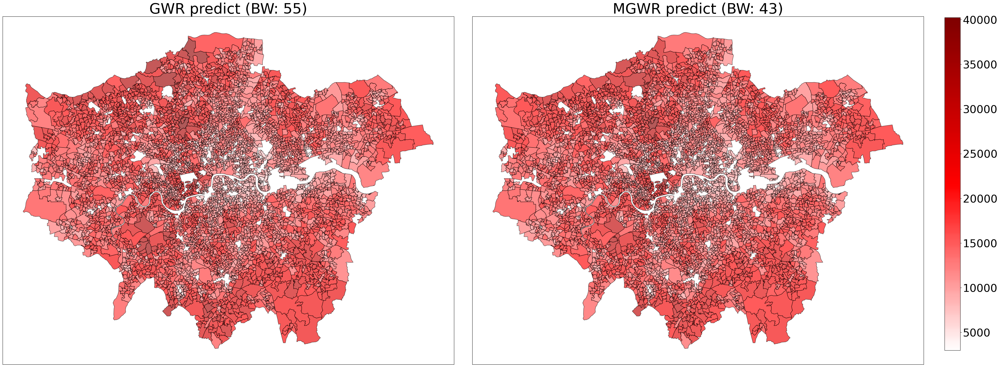

In [3]:
#Comparison maps of GWR vs. MGWR parameter surfaces where the grey units pertain to statistically insignificant parameters
parampl = 'prop_EE_ABC'

#Prep plot and add axes
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(40,17))
ax0 = axes[0]
ax0.set_title(f'GWR {parampl} (BW: 55)', fontsize=40)
ax1 = axes[1]
ax1.set_title(f'MGWR {parampl} (BW: 43)', fontsize=40)

#Set color map
cmap = plt.cm.seismic

#Find min and max values of the two combined datasets
gwr_min = df[f'gwr_{parampl}'].min()
gwr_max = df[f'gwr_{parampl}'].max()
mgwr_min = df[f'mgwr_{parampl}'].min()
mgwr_max = df[f'mgwr_{parampl}'].max()
vmin = np.min([gwr_min, mgwr_min])
vmax = np.max([gwr_max, mgwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df.plot(f'gwr_{parampl}', cmap=sm.cmap, ax=ax0, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax0, **{'edgecolor':'black'})

#Plot MGWR parameters
df.plot(f'mgwr_{parampl}', cmap=sm.cmap, ax=ax1, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (mgwr_filtered_t[:,0] == 0).any():
    df[mgwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax1, **{'edgecolor':'black'})
 
#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.015, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=30) 
ax0.get_xaxis().set_visible(False)
ax0.get_yaxis().set_visible(False)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
plt.savefig(f'output/varg{asnr}/Var{asnr}_{parampl}.png', dpi=300, bbox_inches='tight')
plt.show()

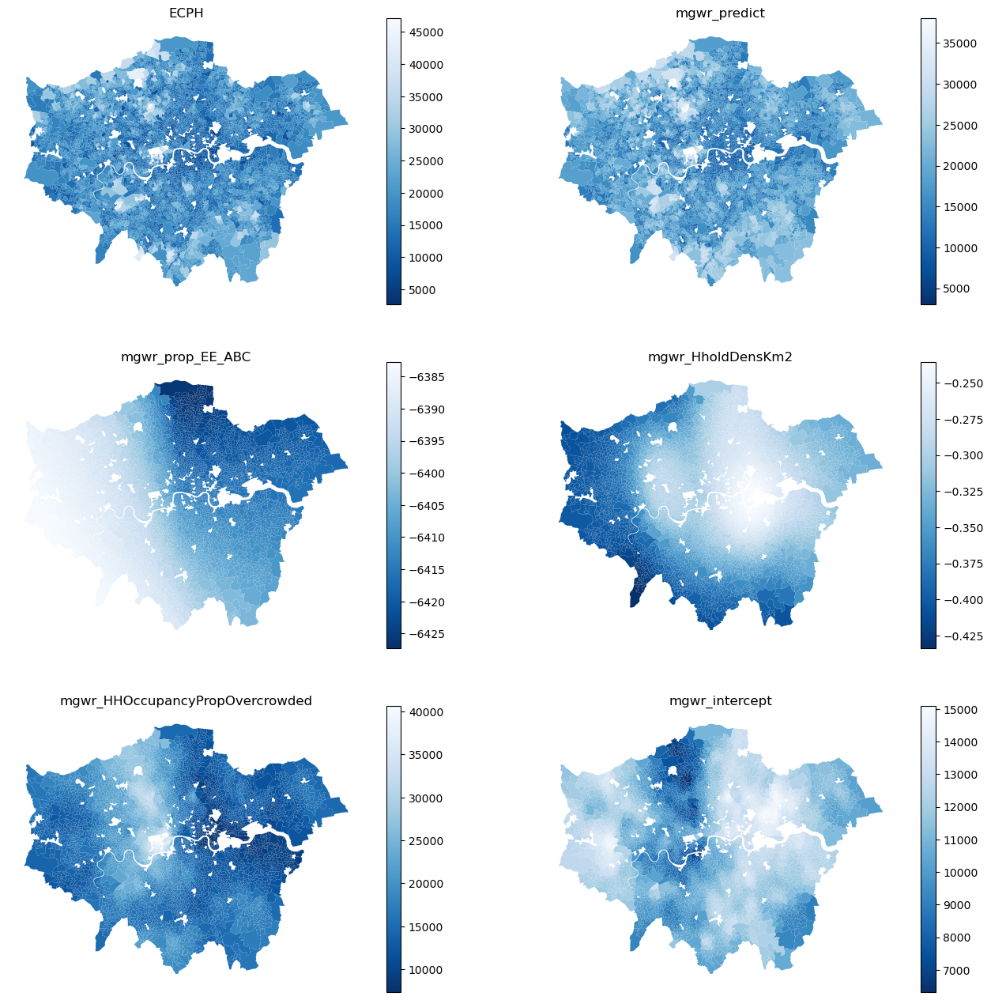

In [23]:
# Mapping MGWR only for better contrast (cause variance much smaller)

col=['ECPH', 'mgwr_predict', 'mgwr_prop_EE_ABC', 'mgwr_HholdDensKm2', 'mgwr_HHOccupancyPropOvercrowded', 'mgwr_intercept']
fig, ax = plt.subplots(3,2, figsize=(16,16))
for i,j,k in zip([i for i in range(3) for _ in range(2)],[i for _ in range(3) for i in range(2)],col):
    df.plot(column=k, cmap='Blues_r',
        legend=True,
        ax=ax[i][j]
       )
    ax[i][j].set_title(k)
    ax[i][j].set_axis_off()

plt.savefig(f'output/varg{asnr}/Var{asnr}_MGWRdetailsBlues.png', dpi=300, bbox_inches='tight')
plt.show()